In [9]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load datasets
df_yield = pd.read_csv(r"C:\Users\Shang Huan\Desktop\MSU\Course\Fall_2024\CMSE_830\project\final_project\yield.csv")
df_temp = pd.read_csv(r"C:\Users\Shang Huan\Desktop\MSU\Course\Fall_2024\CMSE_830\project\final_project\temp.csv")
df_rainfall = pd.read_csv(r"C:\Users\Shang Huan\Desktop\MSU\Course\Fall_2024\CMSE_830\project\final_project\rainfall.csv")
df_pesticides = pd.read_csv(r"C:\Users\Shang Huan\Desktop\MSU\Course\Fall_2024\CMSE_830\project\final_project\pesticides.csv")



Yield Dataset Description:
(56717, 12)
          Area Code  Element Code     Item Code     Year Code          Year  \
count  56717.000000       56717.0  56717.000000  56717.000000  56717.000000   
mean     125.650422        5419.0    111.611651   1989.669570   1989.669570   
std       75.120195           0.0    101.278435     16.133198     16.133198   
min        1.000000        5419.0     15.000000   1961.000000   1961.000000   
25%       58.000000        5419.0     56.000000   1976.000000   1976.000000   
50%      122.000000        5419.0    116.000000   1991.000000   1991.000000   
75%      184.000000        5419.0    125.000000   2004.000000   2004.000000   
max      351.000000        5419.0    489.000000   2016.000000   2016.000000   

                Value  
count    56717.000000  
mean     62094.660084  
std      67835.932856  
min          0.000000  
25%      15680.000000  
50%      36744.000000  
75%      86213.000000  
max    1000000.000000  
<class 'pandas.core.frame.DataFra

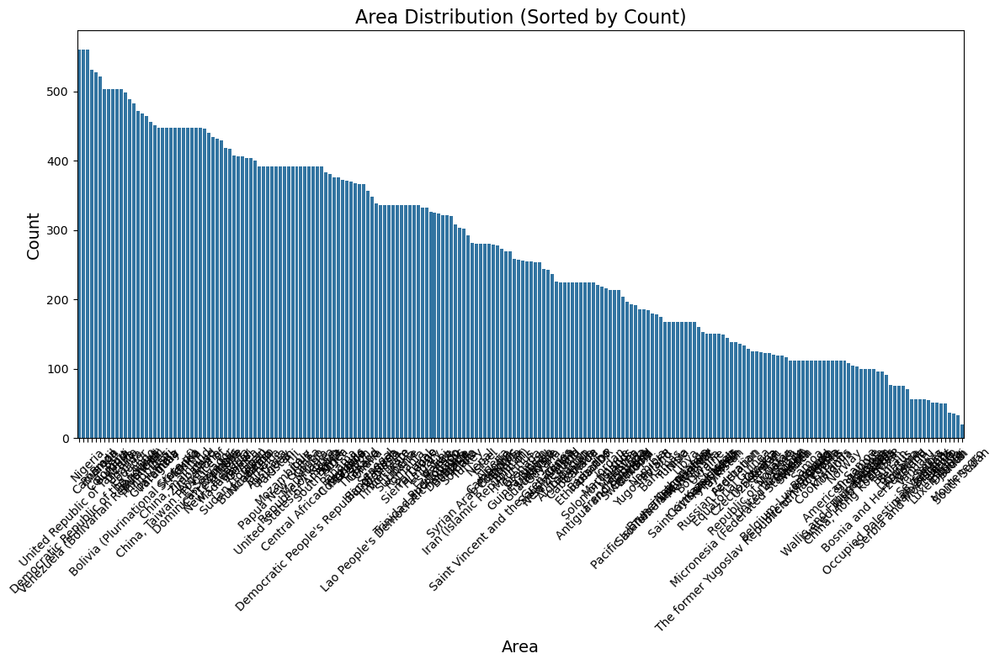

Top 10 Areas by Count:
Area
United Republic of Tanzania           560
Democratic Republic of the Congo      560
Nigeria                               560
Venezuela (Bolivarian Republic of)    532
Cameroon                              528
Rwanda                                522
Brazil                                504
Colombia                              504
Burundi                               504
Peru                                  504
Name: count, dtype: int64

Bottom 10 Areas by Count:
Area
Faroe Islands    56
Serbia           55
Belgium          51
Luxembourg       51
Latvia           50
Estonia          50
Djibouti         36
Sudan            35
Montenegro       33
South Sudan      20
Name: count, dtype: int64


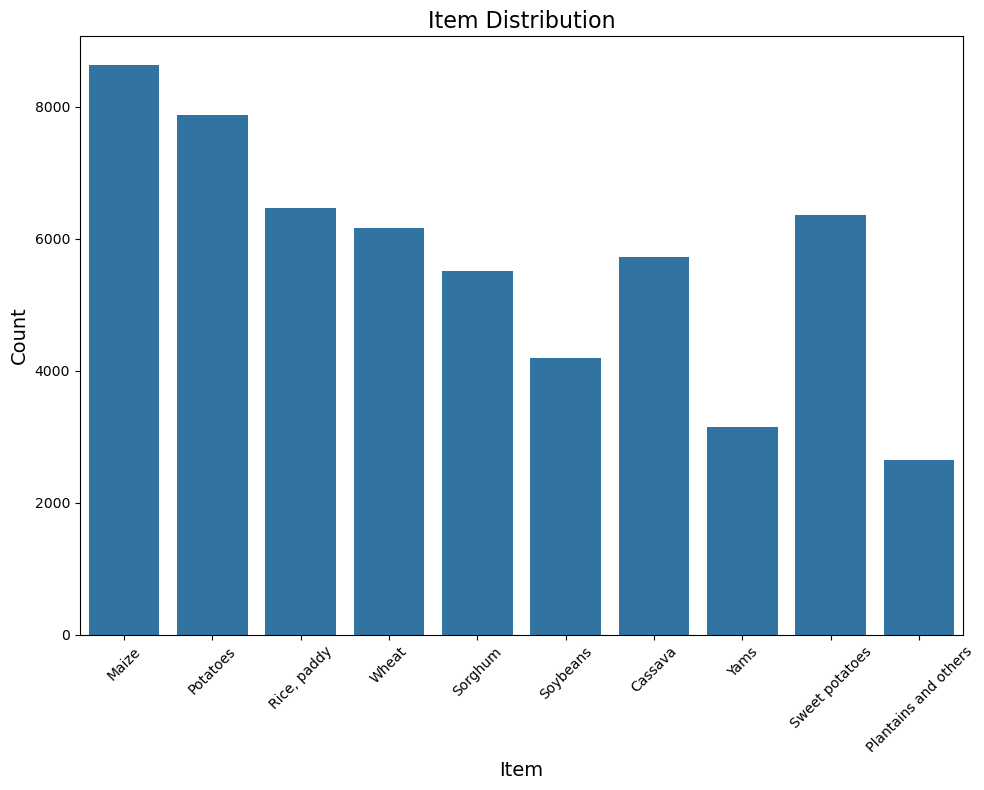

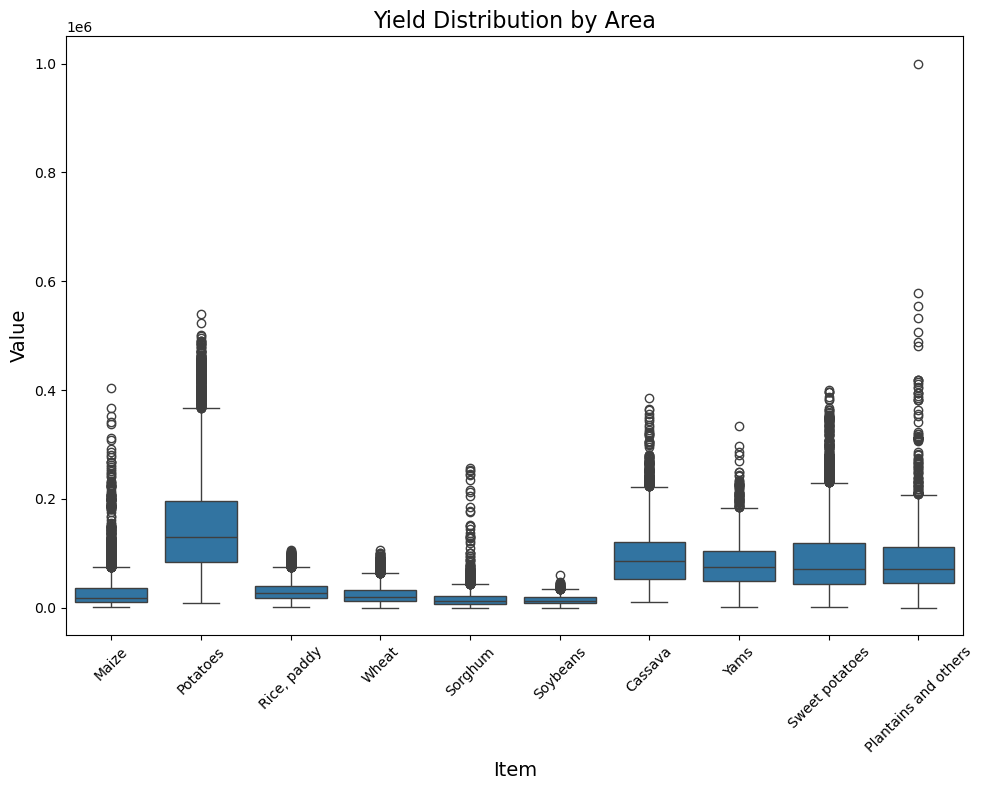

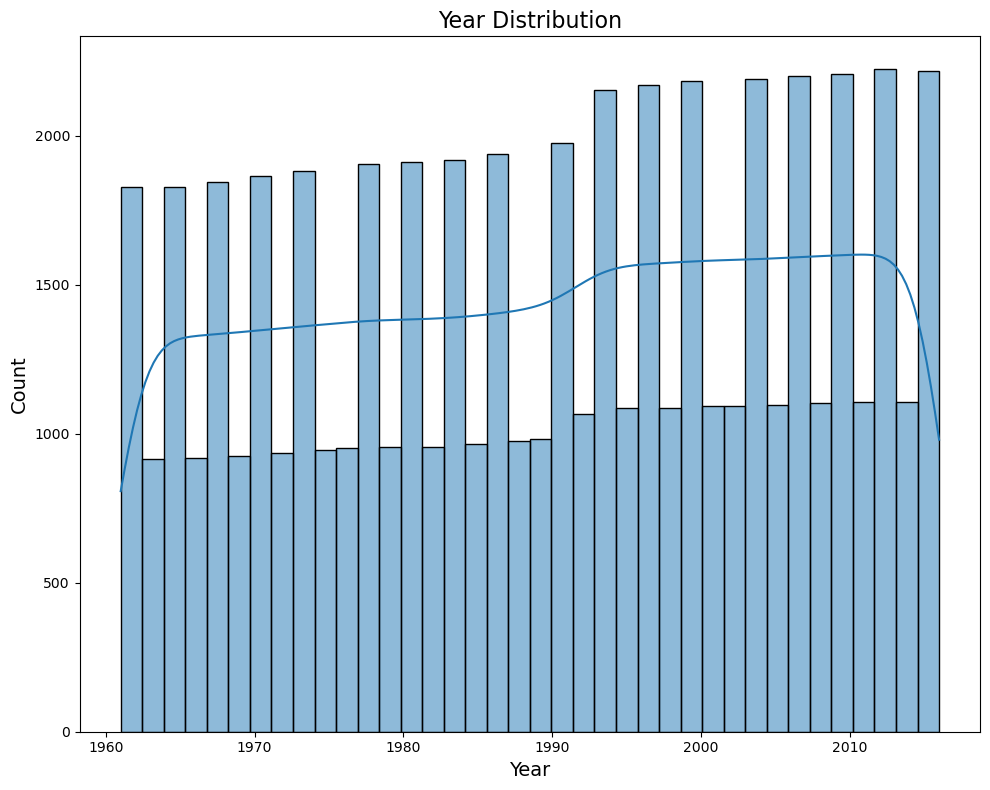

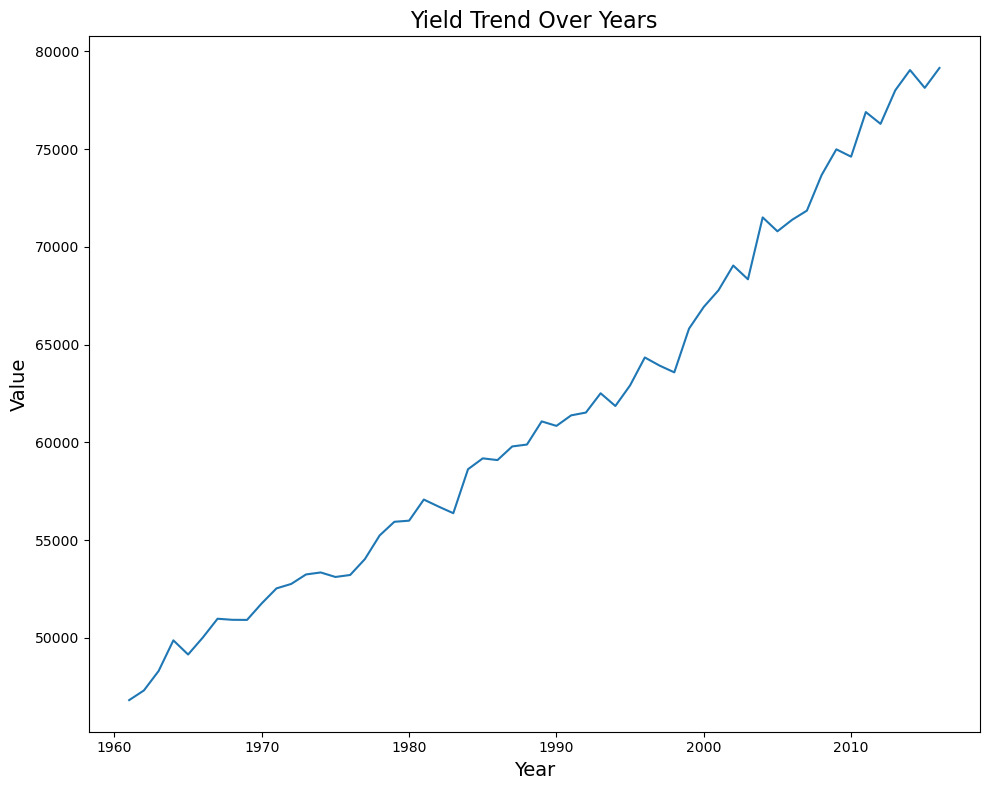

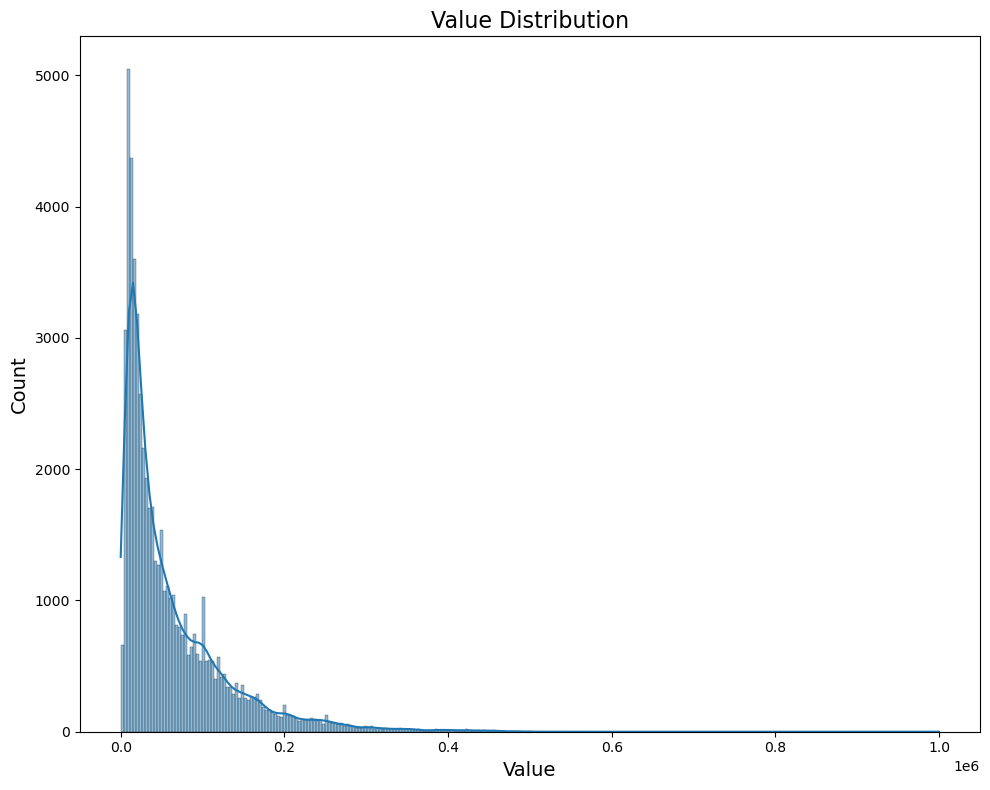

In [10]:
# Display statistical description and size of df_yield
print("Yield Dataset Description:")
print(df_yield.shape)
print(df_yield.describe())
print(df_yield.info())
print(df_yield.head)
print("\n" + "="*50 + "\n")

# Store the relationship between area code and area name & item code and item in the dictionary.
area_code_vs_area_dict = dict(zip(df_yield["Area Code"], df_yield["Area"]))
print(len(area_code_vs_area_dict))
print(list(area_code_vs_area_dict.items())[:5])

item_code_vs_item_dict = dict(zip(df_yield["Item Code"], df_yield["Item"]))
print(len(item_code_vs_item_dict))
print(list(item_code_vs_item_dict.items())[:5])

# Drop unnecessary columns in df_yield
yield_data_dropped = df_yield.drop(columns=["Domain Code", "Domain", "Area Code", "Element Code", "Item Code","Element", "Year Code", "Unit"])
yield_data_dropped.rename(columns={"Year": "year"}, inplace=True)
print(yield_data_dropped)


# Sort areas by descending count for barplot
sorted_areas_count = yield_data_dropped["Area"].value_counts().index

# Plot 1: Area Group Distribution ordered by descending count
plt.figure(figsize=(12, 8))
sns.countplot(data=yield_data_dropped, x="Area", order=sorted_areas_count)
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution (Sorted by Count)', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Get the top 10 and bottom 10 areas by count
area_counts = yield_data_dropped["Area"].value_counts()
top_10_areas = area_counts.head(10)
bottom_10_areas = area_counts.tail(10)

print("Top 10 Areas by Count:")
print(top_10_areas)
print("\nBottom 10 Areas by Count:")
print(bottom_10_areas)

# Plot 2: Item Distribution
plt.figure(figsize=(10, 8))
sns.countplot(data=yield_data_dropped, x="Item")
plt.xlabel('Item', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Item Distribution', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 3: Yield Distribution by Crops
plt.figure(figsize=(10, 8))
sns.boxplot(data=yield_data_dropped, x="Item", y="Value")
plt.xlabel('Item', fontsize=14)
plt.ylabel('Value', fontsize=14)
plt.title('Yield Distribution by Area', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 3: Year Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=yield_data_dropped, x="year", kde=True)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Year Distribution', fontsize=16)
plt.tight_layout()
plt.show()

# Plot 4: Temperature Trend Over Years
plt.figure(figsize=(10, 8))
sns.lineplot(data=yield_data_dropped, x="year", y="Value", errorbar=None)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Value', fontsize=14)
plt.title('Yield Trend Over Years', fontsize=16)
plt.tight_layout()
plt.show()

# Plot 5: Value Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=yield_data_dropped, x="Value", kde=True)
plt.xlabel('Value', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Value Distribution', fontsize=16)
plt.tight_layout()
plt.show()


Temperature Dataset Description:
Dataset size: (71311, 3)
               year      avg_temp
count  71311.000000  68764.000000
mean    1905.799007     16.183876
std       67.102099      7.592960
min     1743.000000    -14.350000
25%     1858.000000      9.750000
50%     1910.000000     16.140000
75%     1962.000000     23.762500
max     2013.000000     30.730000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71311 entries, 0 to 71310
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   year      71311 non-null  int64  
 1   country   71311 non-null  object 
 2   avg_temp  68764 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.6+ MB
None
<bound method NDFrame.head of        year      country  avg_temp
0      1833  Afghanistan     13.91
1      1834  Afghanistan     13.91
2      1835  Afghanistan     14.71
3      1836  Afghanistan       NaN
4      1837  Afghanistan     15.47
...     ...          ...  

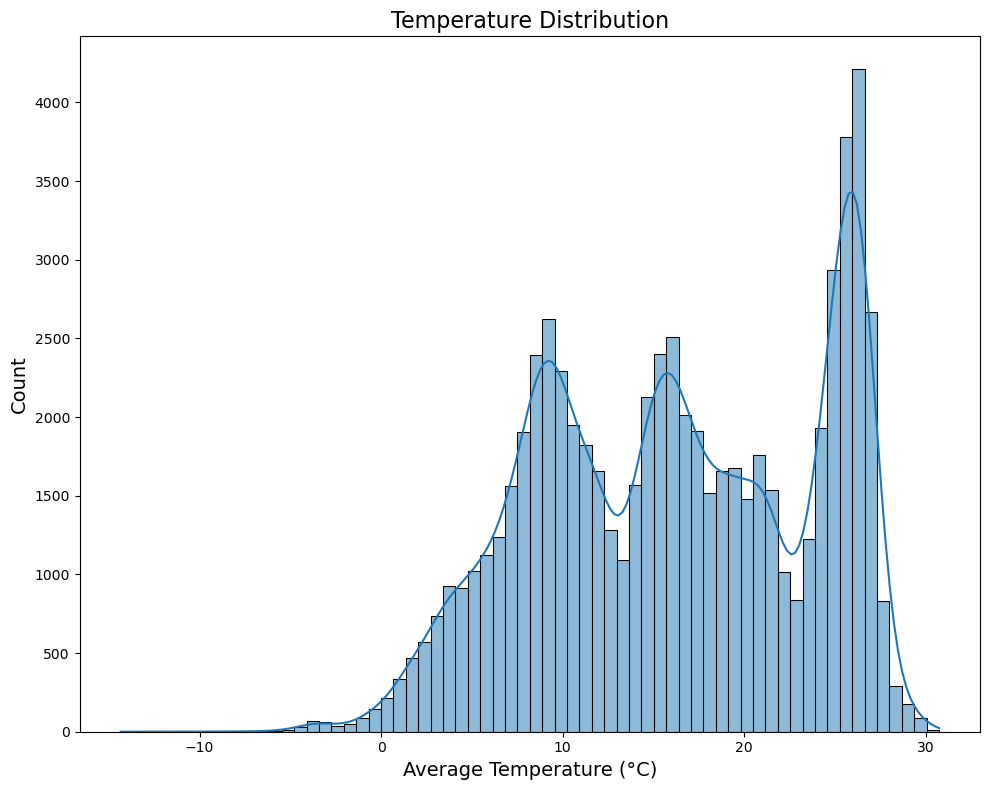

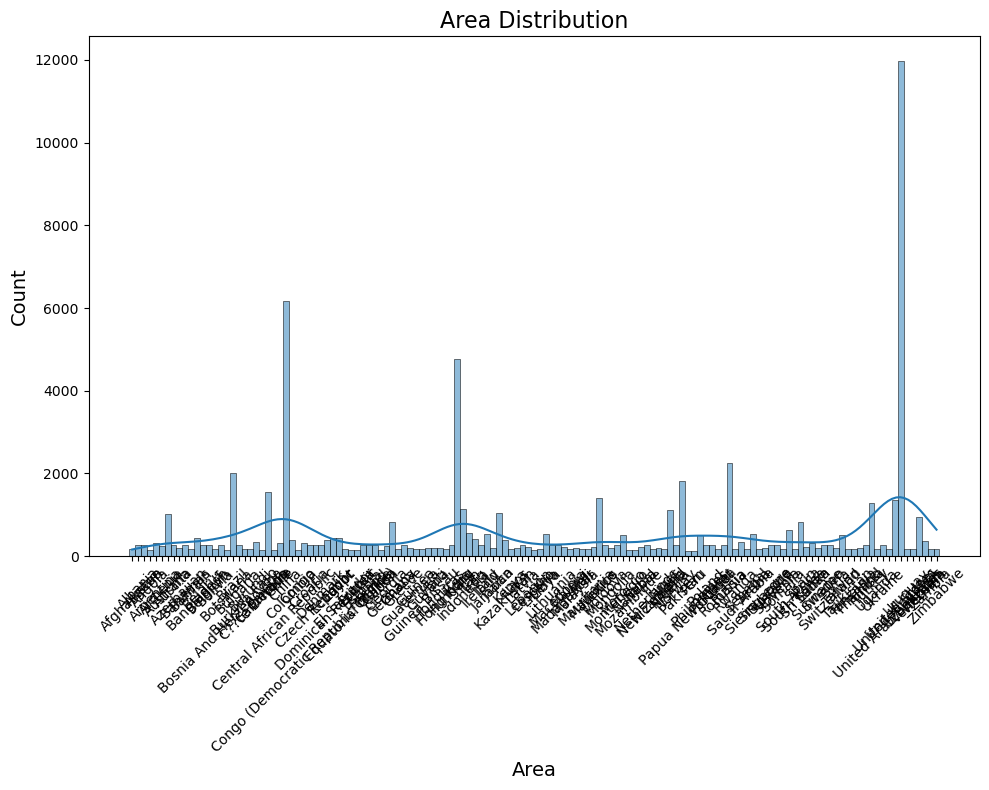

Top 10 Areas by Count:
Area
United States     11973
China              6172
India              4756
Russia             2257
Brazil             1997
Pakistan           1805
Canada             1541
Mexico             1394
United Kingdom     1355
Turkey             1285
Name: count, dtype: int64

Bottom 10 Areas by Count:
Area
Equatorial Guinea           158
Congo                       158
Central African Republic    158
Botswana                    157
Lesotho                     157
Mozambique                  157
Namibia                     157
Eritrea                     150
Peru                        133
Papua New Guinea            132
Name: count, dtype: int64


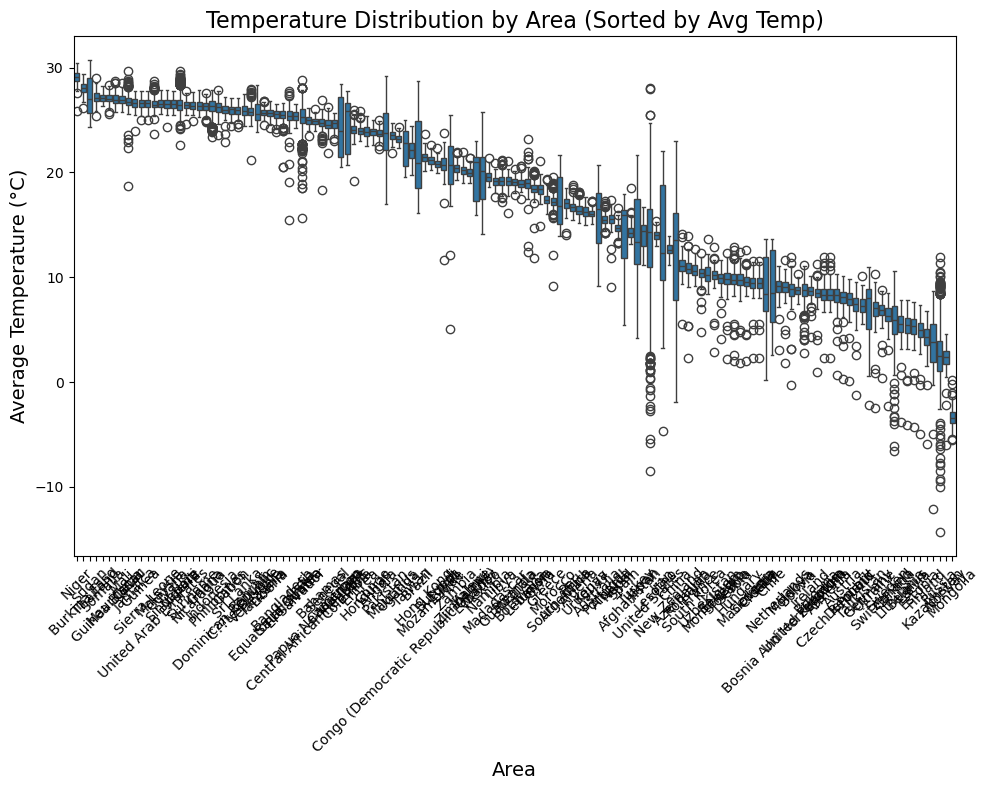

Top 10 Hottest Areas:
Area
Niger            29.039801
Burkina Faso     28.049167
Sudan            27.372804
Thailand         27.154263
Somalia          27.150851
Guinea Bissau    27.053861
Mauritania       27.023851
Mali             26.969557
Qatar            26.766707
Jamaica          26.624021
Name: avg_temp, dtype: float64

Top 10 Coldest Areas:
Area
Mongolia     -3.367113
Norway        2.336105
Russia        2.670302
Kazakhstan    3.766062
Finland       4.244195
Estonia       4.883333
Latvia        5.232060
Belarus       5.360075
Lithuania     5.459139
Canada        5.828524
Name: avg_temp, dtype: float64


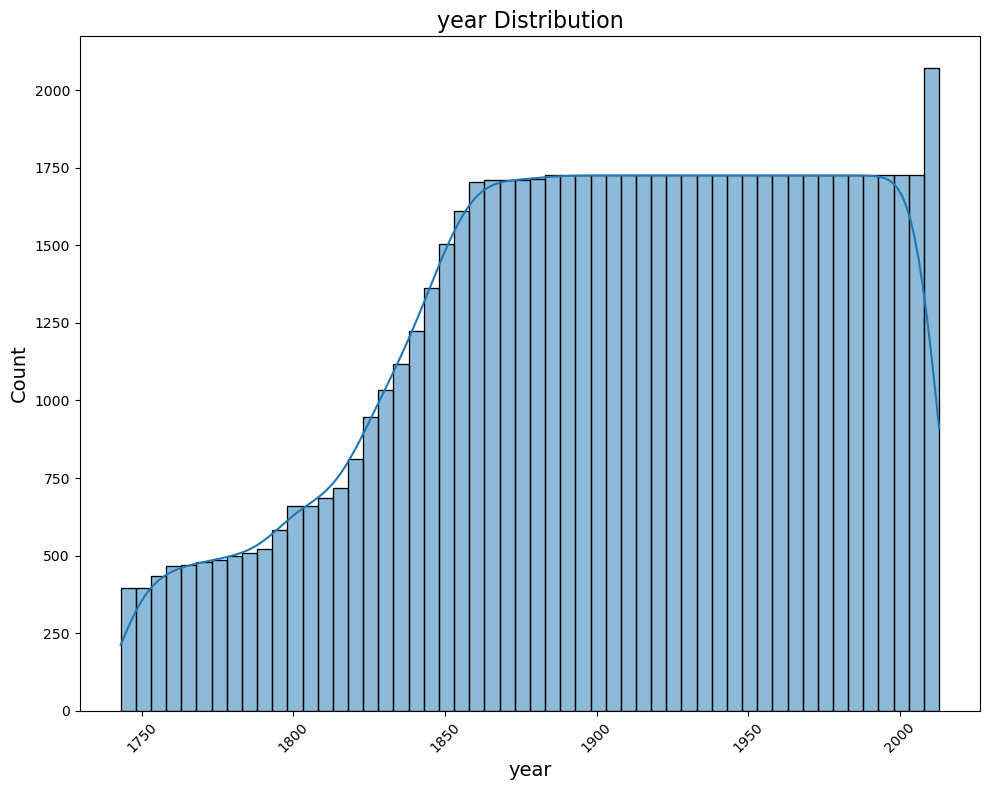

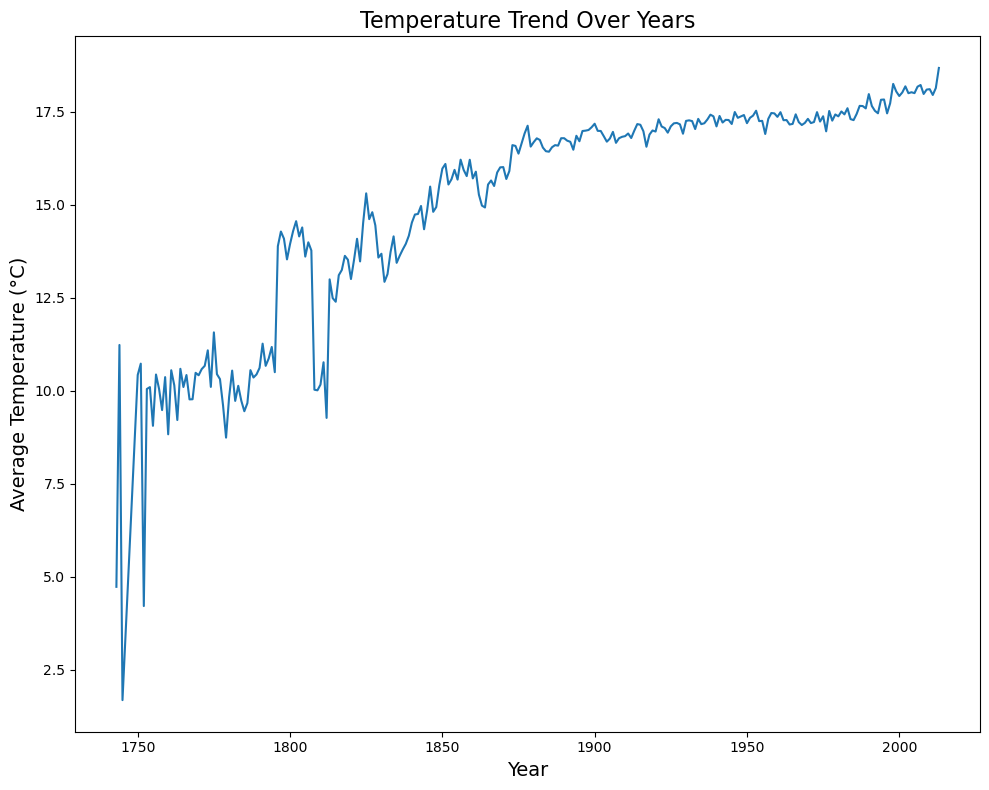

In [11]:
print("Temperature Dataset Description:")
print(f"Dataset size: {df_temp.shape}")
print(df_temp.describe())
print(df_temp.info())
print(df_temp.head)
print("\n" + "="*50 + "\n")

# Rename the column 'country' to 'area' in the temperature dataset
df_temp_dropped = df_temp.rename(columns={"country": "Area"})
print(df_temp_dropped.head())

# Plot 1: Temperature Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=df_temp_dropped, x="avg_temp", kde=True)
plt.xlabel('Average Temperature (°C)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Temperature Distribution', fontsize=16)
plt.tight_layout()
plt.show()

# Plot 2: Area Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=df_temp_dropped, x="Area", kde=True)
plt.xlabel("Area", fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Get the top 10 and bottom 10 areas by count
area_counts = df_temp_dropped["Area"].value_counts()
top_10_areas = area_counts.head(10)
bottom_10_areas = area_counts.tail(10)

print("Top 10 Areas by Count:")
print(top_10_areas)
print("\nBottom 10 Areas by Count:")
print(bottom_10_areas)

# Sort areas by descending order of average temperature for boxplot
sorted_areas = df_temp_dropped.groupby("Area")["avg_temp"].mean().sort_values(ascending=False).index

# Plot 3: Temperature Distribution by Area ordered by descending temperature
plt.figure(figsize=(10, 8))
sns.boxplot(data=df_temp_dropped, x="Area", y="avg_temp", order=sorted_areas)
plt.xlabel('Area', fontsize=14)
plt.ylabel('Average Temperature (°C)', fontsize=14)
plt.title('Temperature Distribution by Area (Sorted by Avg Temp)', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Get the top 10 hottest and coldest areas
average_temperature_by_area = df_temp_dropped.groupby("Area")["avg_temp"].mean()
hottest_areas = average_temperature_by_area.nlargest(10)
coldest_areas = average_temperature_by_area.nsmallest(10)

print("Top 10 Hottest Areas:")
print(hottest_areas)
print("\nTop 10 Coldest Areas:")
print(coldest_areas)

# Plot 4: Area Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=df_temp_dropped, x="year", kde=True)
plt.xlabel("year", fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('year Distribution', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 5: Temperature Trend Over Years
plt.figure(figsize=(10, 8))
sns.lineplot(data=df_temp_dropped, x="year", y="avg_temp", errorbar=None)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Temperature (°C)', fontsize=14)
plt.title('Temperature Trend Over Years', fontsize=16)
plt.tight_layout()
plt.show()


Rainfall Dataset Description:
Dataset size: (6727, 3)
              Year
count  6727.000000
mean   2001.354839
std       9.530114
min    1985.000000
25%    1993.000000
50%    2001.000000
75%    2010.000000
max    2017.000000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6727 entries, 0 to 6726
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Area                           6727 non-null   object
 1   Year                           6727 non-null   int64 
 2   average_rain_fall_mm_per_year  5953 non-null   object
dtypes: int64(1), object(2)
memory usage: 157.8+ KB
None
          Area  Year average_rain_fall_mm_per_year
0  Afghanistan  1985                           327
1  Afghanistan  1986                           327
2  Afghanistan  1987                           327
3  Afghanistan  1989                           327
4  Afghanistan  1990                           327


         

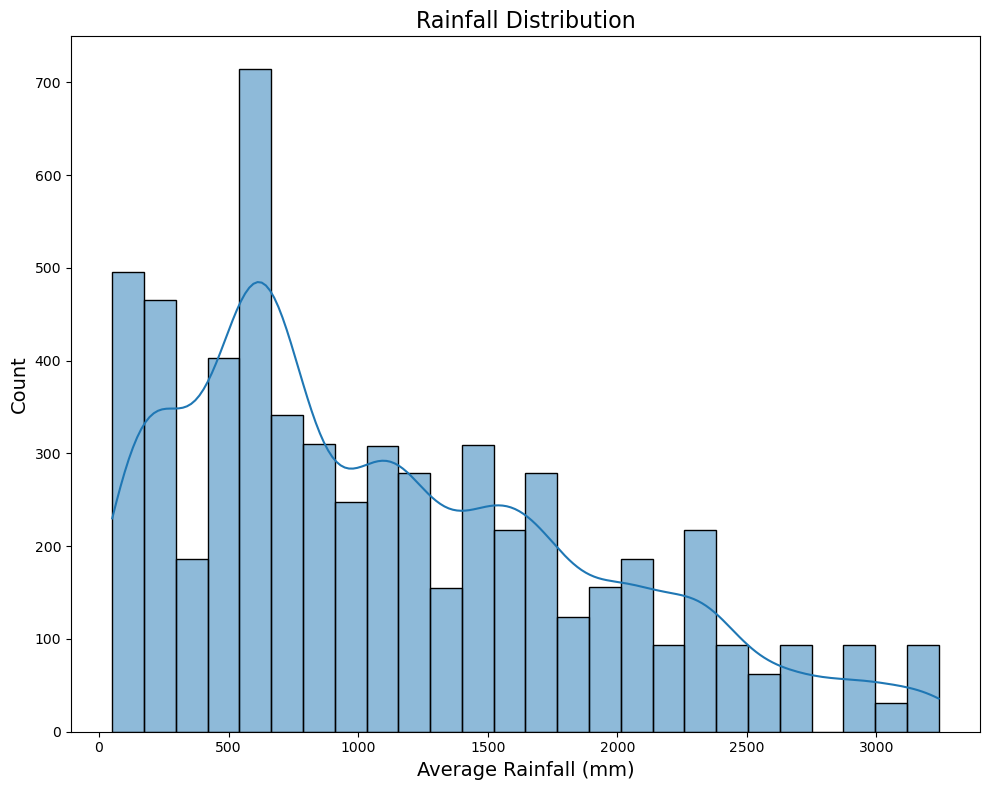

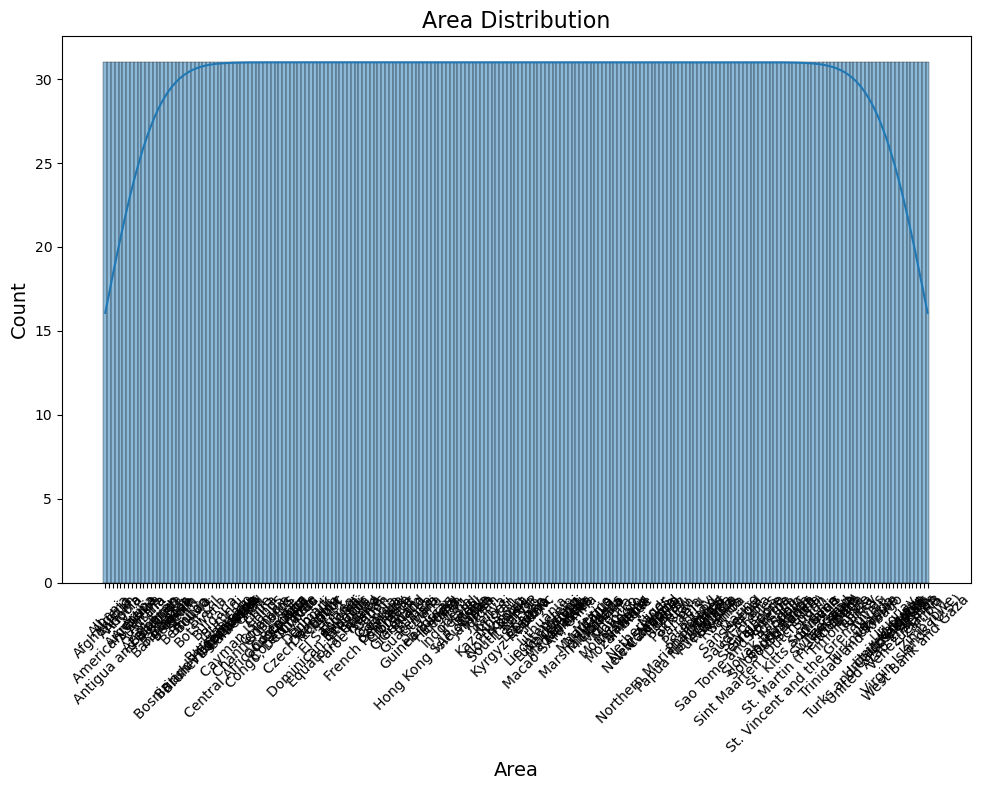

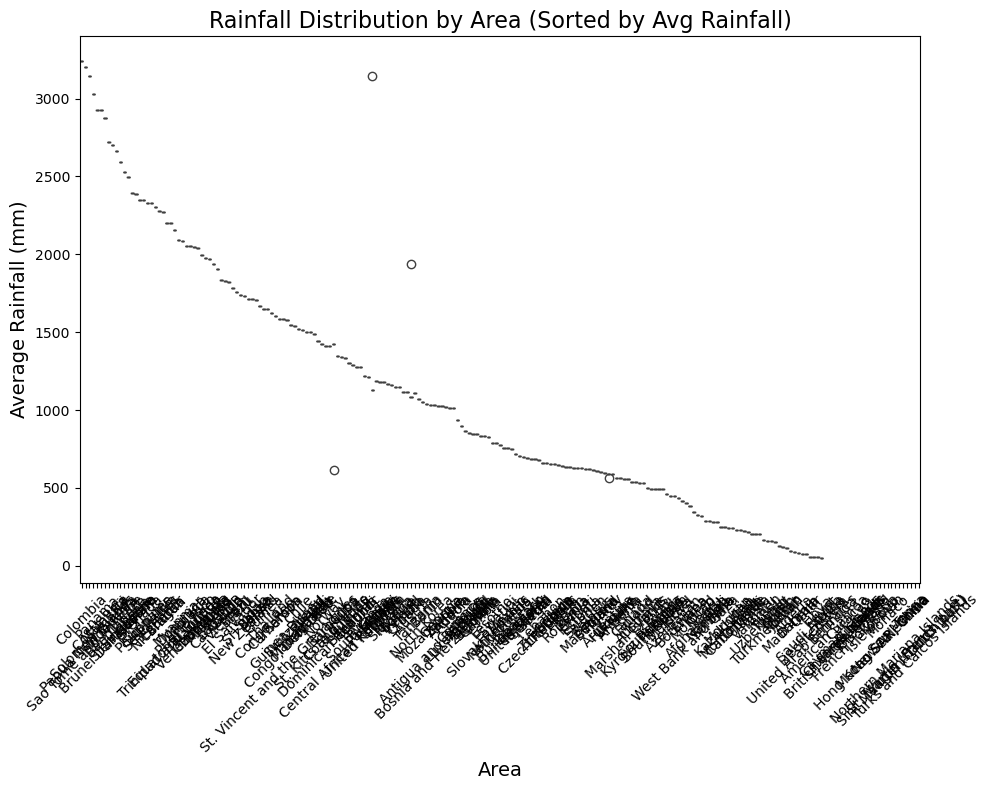

Top 10 Areas with Highest Rainfall:
Area
Colombia                 3240.0
Sao Tome and Principe    3200.0
Papua New Guinea         3142.0
Solomon Islands          3028.0
Panama                   2928.0
Costa Rica               2926.0
Malaysia                 2875.0
Brunei Darussalam        2722.0
Indonesia                2702.0
Bangladesh               2666.0
Name: average_rain_fall_mm_per_year, dtype: float64

Top 10 Areas with Lowest Rainfall:
Area
Egypt                    51.0
Libya                    56.0
Liechtenstein            56.0
Saudi Arabia             59.0
Qatar                    74.0
United Arab Emirates     78.0
Bahrain                  83.0
Algeria                  89.0
Mauritania               92.0
Jordan                  111.0
Name: average_rain_fall_mm_per_year, dtype: float64


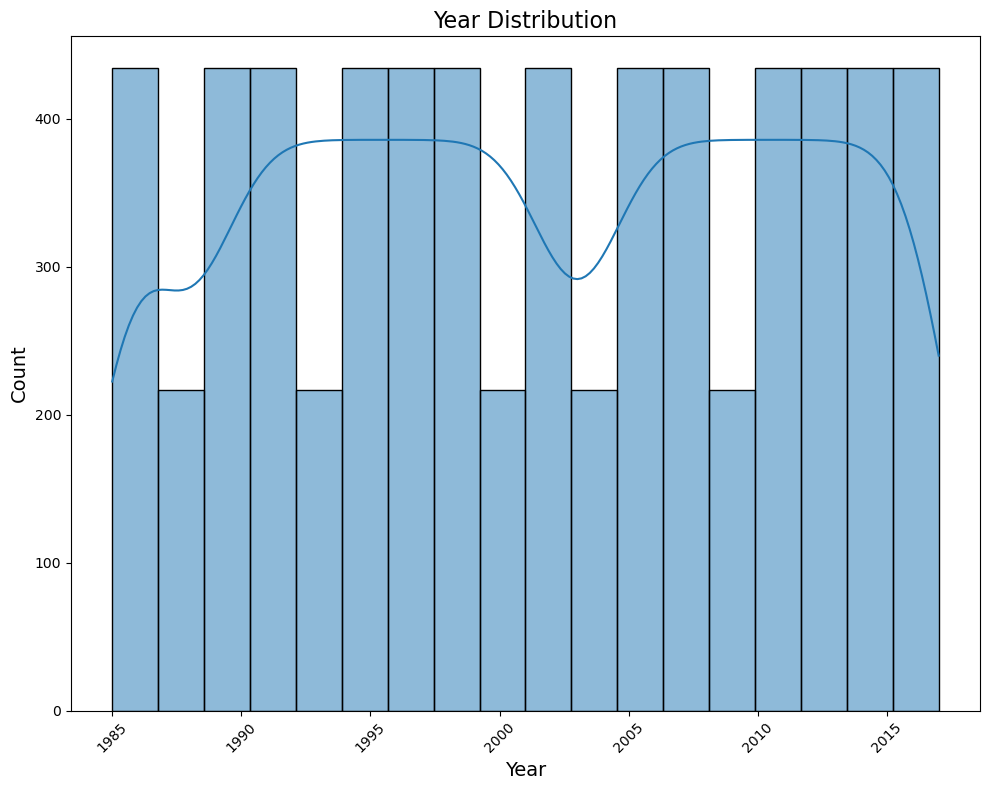

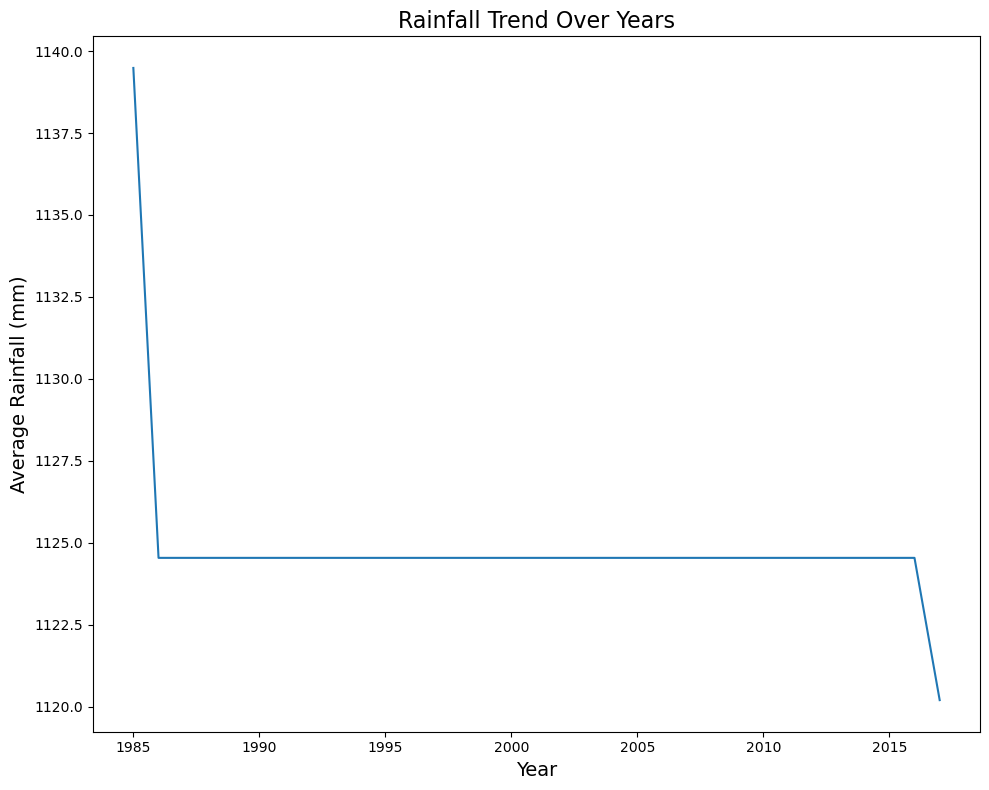

In [12]:
# Display statistical description and size of df_rainfall
print("Rainfall Dataset Description:")
print(f"Dataset size: {df_rainfall.shape}")
print(df_rainfall.describe())
print(df_rainfall.info())
print(df_rainfall.head())
print("\n" + "="*50 + "\n")

# Convert average_rain_fall_mm_per_year column to numeric data
df_rainfall["average_rain_fall_mm_per_year"] = pd.to_numeric(df_rainfall["average_rain_fall_mm_per_year"], errors='coerce')
df_rainfall_dropped = df_rainfall.rename(columns={"Year": "year"})
print(df_rainfall_dropped)

# Plot 1: Rainfall Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=df_rainfall_dropped, x="average_rain_fall_mm_per_year", kde=True)
plt.xlabel('Average Rainfall (mm)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Rainfall Distribution', fontsize=16)
plt.tight_layout()
plt.show()

# Plot 2: Area Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=df_rainfall_dropped, x="Area", kde=True)
plt.xlabel("Area", fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Sort areas by descending order of average rainfall for boxplot
sorted_areas = df_rainfall_dropped.groupby("Area")["average_rain_fall_mm_per_year"].mean().sort_values(ascending=False).index

# Plot 3: Rainfall Distribution by Area ordered by descending rainfall
plt.figure(figsize=(10, 8))
sns.boxplot(data=df_rainfall_dropped, x="Area", y="average_rain_fall_mm_per_year", order=sorted_areas)
plt.xlabel('Area', fontsize=14)
plt.ylabel('Average Rainfall (mm)', fontsize=14)
plt.title('Rainfall Distribution by Area (Sorted by Avg Rainfall)', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Get the top 10 highest and lowest rainfall areas
average_rainfall_by_area = df_rainfall_dropped.groupby("Area")["average_rain_fall_mm_per_year"].mean()
highest_rainfall_areas = average_rainfall_by_area.nlargest(10)
lowest_rainfall_areas = average_rainfall_by_area.nsmallest(10)

print("Top 10 Areas with Highest Rainfall:")
print(highest_rainfall_areas)
print("\nTop 10 Areas with Lowest Rainfall:")
print(lowest_rainfall_areas)

# Plot 4: Year Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=df_rainfall_dropped, x="year", kde=True)
plt.xlabel("Year", fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Year Distribution', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 5: Rainfall Trend Over Years
plt.figure(figsize=(10, 8))
sns.lineplot(data=df_rainfall_dropped, x="year", y="average_rain_fall_mm_per_year", errorbar=None)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Rainfall (mm)', fontsize=14)
plt.title('Rainfall Trend Over Years', fontsize=16)
plt.tight_layout()
plt.show()




Pesticides Dataset Description:
(4349, 7)
              Year         Value
count  4349.000000  4.349000e+03
mean   2003.138883  2.030334e+04
std       7.728044  1.177362e+05
min    1990.000000  0.000000e+00
25%    1996.000000  9.300000e+01
50%    2003.000000  1.137560e+03
75%    2010.000000  7.869000e+03
max    2016.000000  1.807000e+06
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4349 entries, 0 to 4348
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Domain   4349 non-null   object 
 1   Area     4349 non-null   object 
 2   Element  4349 non-null   object 
 3   Item     4349 non-null   object 
 4   Year     4349 non-null   int64  
 5   Unit     4349 non-null   object 
 6   Value    4349 non-null   float64
dtypes: float64(1), int64(1), object(5)
memory usage: 238.0+ KB
None
           Domain     Area Element                Item  Year  \
0  Pesticides Use  Albania     Use  Pesticides (total)  1990   
1  Pesticides Us

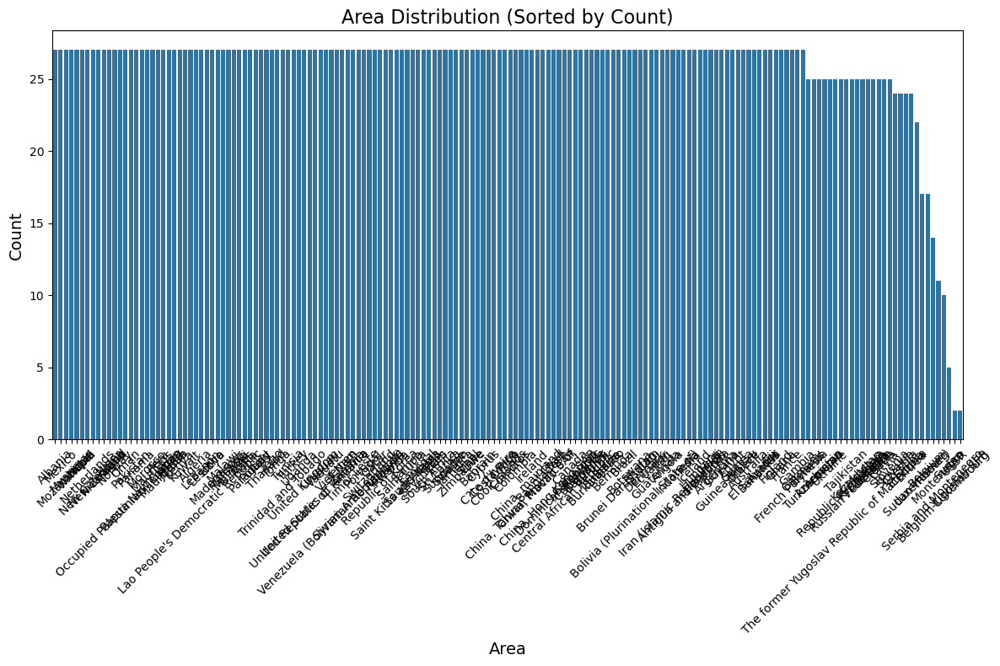

Top 10 Areas by Count:
Area
Albania          27
Mexico           27
Mozambique       27
Myanmar          27
Namibia          27
Nepal            27
Netherlands      27
New Caledonia    27
New Zealand      27
Nicaragua        27
Name: count, dtype: int64

Bottom 10 Areas by Count:
Area
Eritrea                  24
Sudan (former)           22
Luxembourg               17
Belgium                  17
Serbia and Montenegro    14
Montenegro               11
Belgium-Luxembourg       10
Sudan                     5
USSR                      2
Yugoslav SFR              2
Name: count, dtype: int64


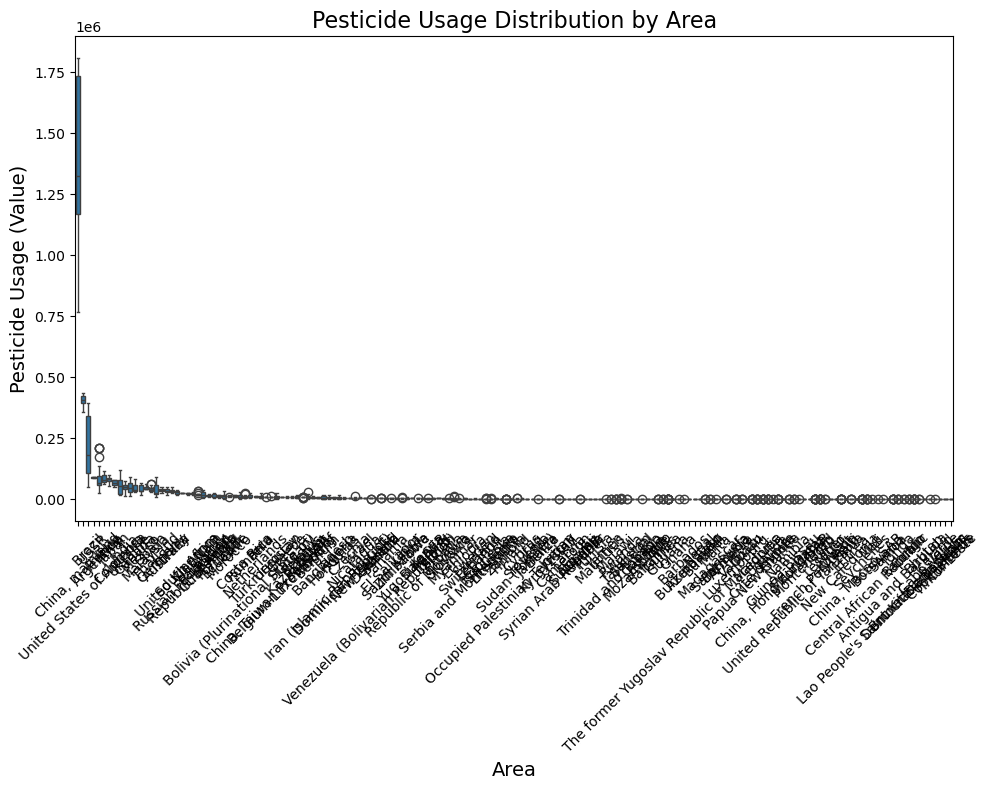

Top 10 Areas by Total Pesticides Used:
Area
China, mainland             37194836.00
United States of America    10978289.10
Brazil                       5671552.00
Argentina                    2250064.53
France                       2248406.72
Italy                        2113106.60
Japan                        1843156.79
Colombia                     1481230.51
India                        1322613.00
Canada                       1253897.98
Name: Value, dtype: float64


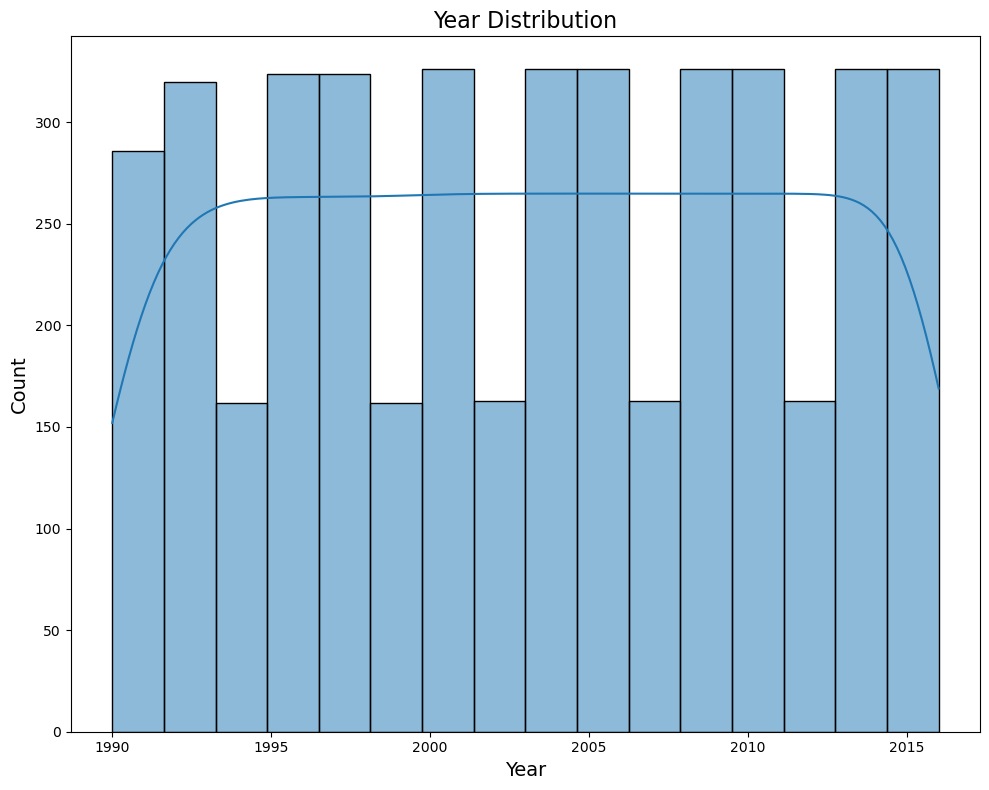

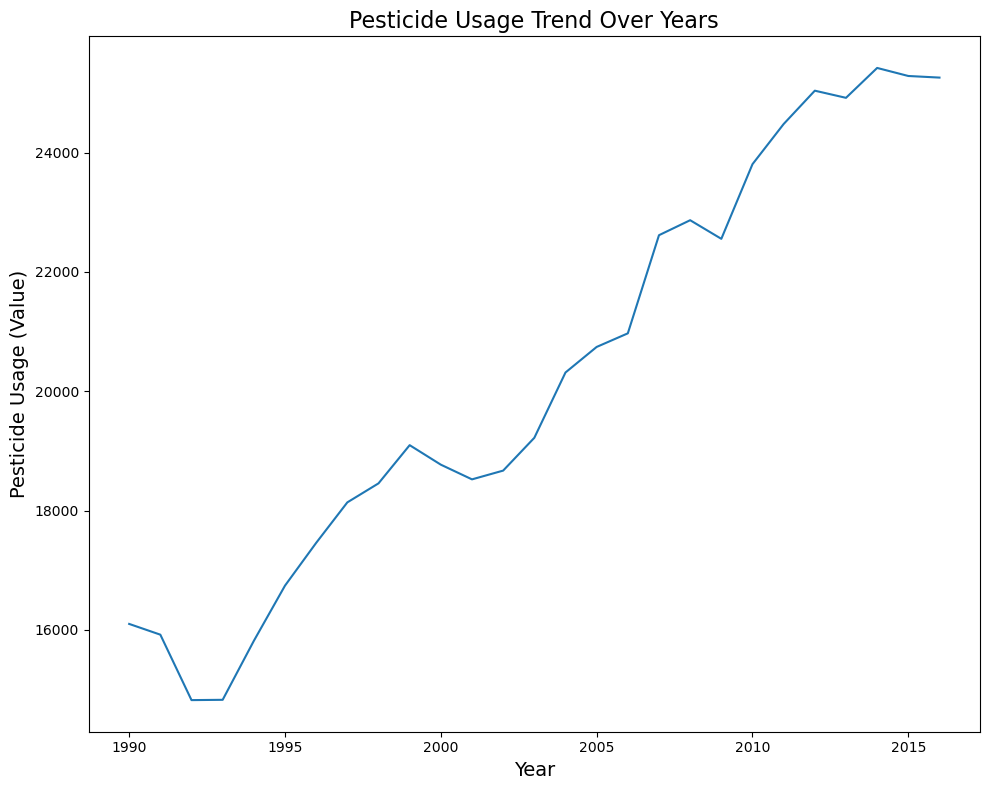

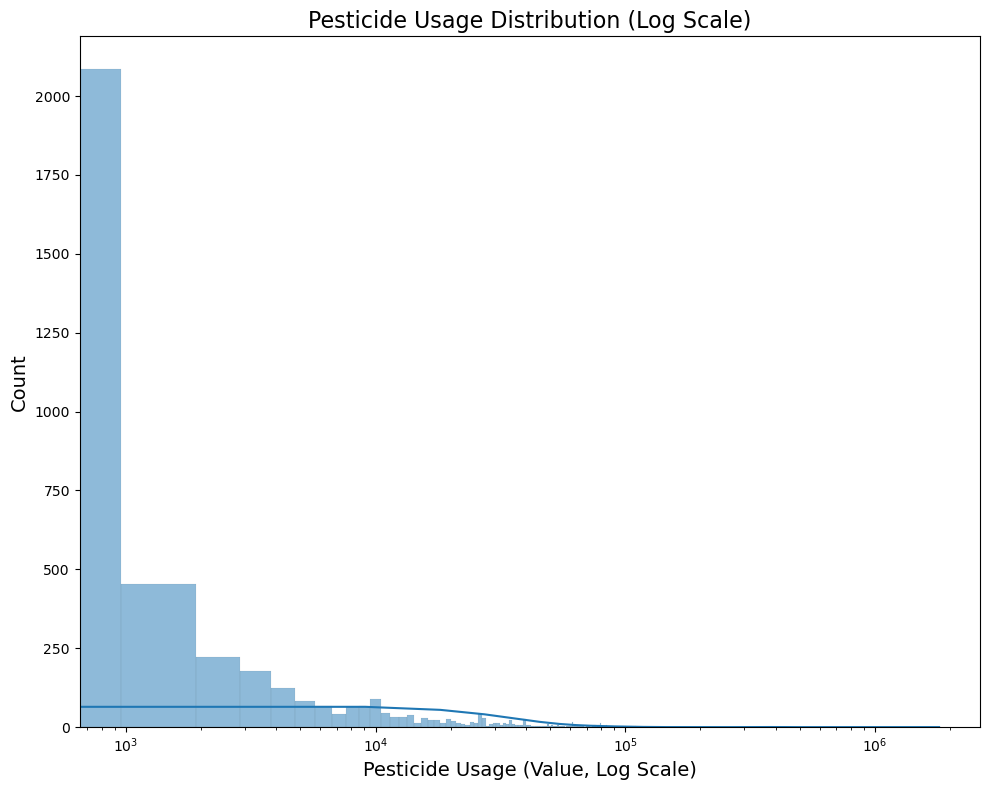

In [13]:
# Display statistical description and size of df_pesticides
print("Pesticides Dataset Description:")
print(df_pesticides.shape)
print(df_pesticides.describe())
print(df_pesticides.info())
print(df_pesticides.head())
print("\n" + "="*50 + "\n")

# Drop unnecessary columns in df_pesticides
pesticides_data_dropped = df_pesticides.drop(columns=["Domain", "Item", "Element", "Unit"])
pesticides_data_dropped.rename(columns={"Year": "year"}, inplace=True)
print(pesticides_data_dropped)

# Sort areas by descending count for barplot
sorted_areas_count = df_pesticides["Area"].value_counts().index

# Plot 1: Area Group Distribution ordered by descending count
plt.figure(figsize=(12, 8))
sns.countplot(data=pesticides_data_dropped, x="Area", order=sorted_areas_count)
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution (Sorted by Count)', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Get the top 10 and bottom 10 areas by count
area_counts = pesticides_data_dropped["Area"].value_counts()
top_10_areas = area_counts.head(10)
bottom_10_areas = area_counts.tail(10)

print("Top 10 Areas by Count:")
print(top_10_areas)
print("\nBottom 10 Areas by Count:")
print(bottom_10_areas)

# Plot 2: Pesticide Distribution by Area
sorted_areas_pesticides_used = pesticides_data_dropped.groupby("Area")["Value"].mean().sort_values(ascending=False).index

plt.figure(figsize=(10, 8))
sns.boxplot(data=pesticides_data_dropped, x="Area", y="Value", order=sorted_areas_pesticides_used)
plt.xlabel('Area', fontsize=14)
plt.ylabel('Pesticide Usage (Value)', fontsize=14)
plt.title('Pesticide Usage Distribution by Area', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Get the top 10 areas by total pesticide usage
area_pesticides_used_order = pesticides_data_dropped.groupby("Area")["Value"].sum().sort_values(ascending=False)
top_10_areas_pesticides_used = area_pesticides_used_order.head(10)

print("Top 10 Areas by Total Pesticides Used:")
print(top_10_areas_pesticides_used)

# Plot 3: Year Distribution
plt.figure(figsize=(10, 8))
sns.histplot(data=pesticides_data_dropped, x="year", kde=True)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Year Distribution', fontsize=16)
plt.tight_layout()
plt.show()

# Plot 4: Pesticide Usage Trend Over Years
plt.figure(figsize=(10, 8))
sns.lineplot(data=pesticides_data_dropped, x="year", y="Value", errorbar=None)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Pesticide Usage (Value)', fontsize=14)
plt.title('Pesticide Usage Trend Over Years', fontsize=16)
plt.tight_layout()
plt.show()

# Plot 5: Pesticide Value Distribution (Log Scale)
plt.figure(figsize=(10, 8))
sns.histplot(data=pesticides_data_dropped, x="Value", kde=True)
plt.xscale("log")
plt.xlabel('Pesticide Usage (Value, Log Scale)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Pesticide Usage Distribution (Log Scale)', fontsize=16)
plt.tight_layout()
plt.show()


Pesticides Dataset Description:
Index(['Area', 'year', 'Value'], dtype='object')
              year         Value
count  4349.000000  4.349000e+03
mean   2003.138883  2.030334e+04
std       7.728044  1.177362e+05
min    1990.000000  0.000000e+00
25%    1996.000000  9.300000e+01
50%    2003.000000  1.137560e+03
75%    2010.000000  7.869000e+03
max    2016.000000  1.807000e+06


Yield Dataset Description:
Index(['Area', 'Item', 'year', 'Value'], dtype='object')
               year           Value
count  56717.000000    56717.000000
mean    1989.669570    62094.660084
std       16.133198    67835.932856
min     1961.000000        0.000000
25%     1976.000000    15680.000000
50%     1991.000000    36744.000000
75%     2004.000000    86213.000000
max     2016.000000  1000000.000000


Temperature Dataset Description:
Index(['year', 'Area', 'avg_temp'], dtype='object')
               year      avg_temp
count  71311.000000  68764.000000
mean    1905.799007     16.183876
std       67.102099    

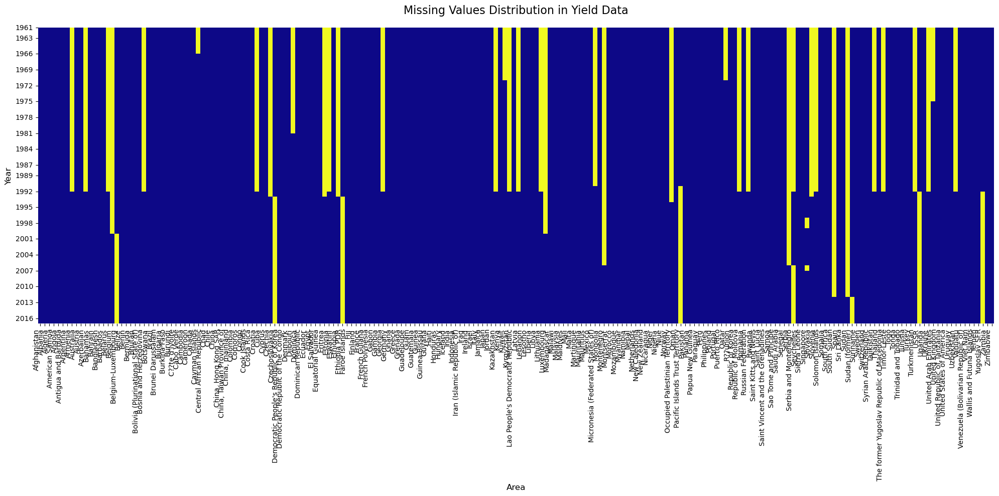

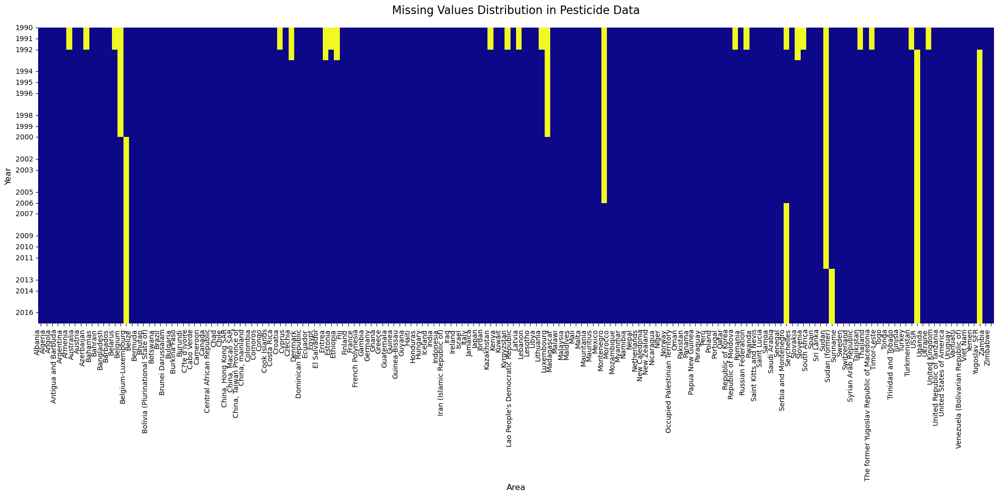

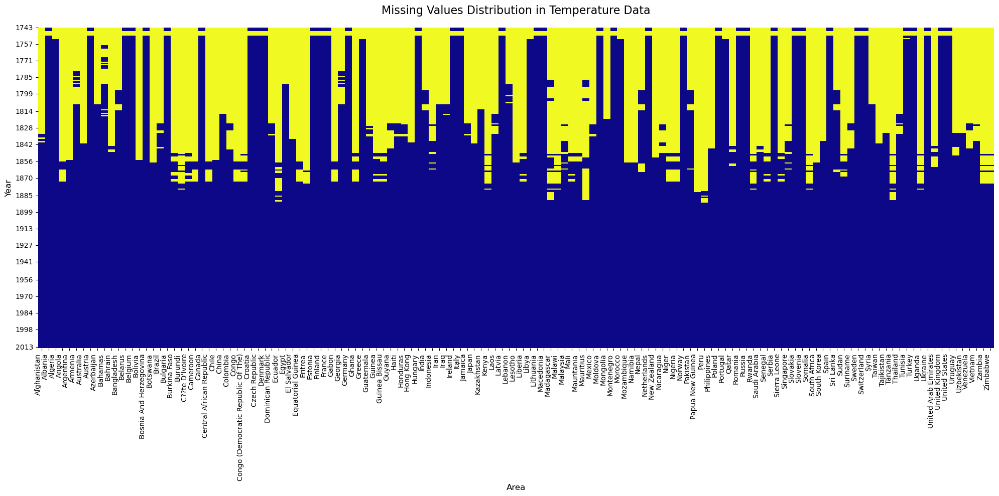

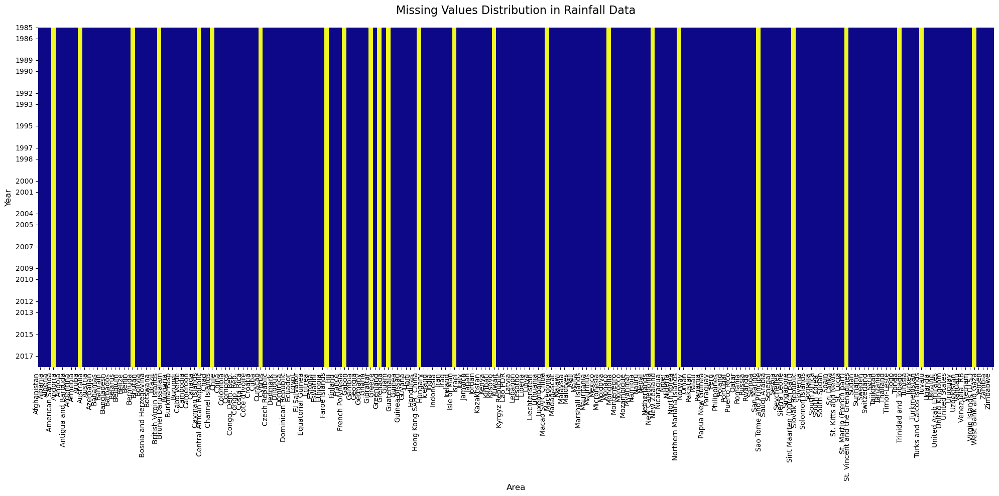

In [14]:
print("Pesticides Dataset Description:")
print(pesticides_data_dropped.columns)
print(pesticides_data_dropped.describe())
print("\n" + "="*50 + "\n")
print("Yield Dataset Description:")
print(yield_data_dropped.columns)
print(yield_data_dropped.describe())
print("\n" + "="*50 + "\n")
print("Temperature Dataset Description:")
print(df_temp_dropped.columns)
print(df_temp_dropped.describe())
print("\n" + "="*50 + "\n")
print("Rainfall Dataset Description:")
print(df_rainfall_dropped.columns)
print(df_rainfall_dropped.describe())
print("\n" + "="*50 + "\n")


# Function to plot missing value heatmaps
def plot_missing_heatmap(df, value_column, title, agg_method='first'):
    """
    Create a heatmap visualization of missing values across areas and years.

    Parameters:
    - df: Input DataFrame
    - value_column: Column containing the values to analyze
    - title: Title of the heatmap
    - agg_method: Method to aggregate duplicate entries (default: 'first')
    """
    # Validate input
    required_columns = ['Area', 'year', value_column]
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"Required column '{col}' not found in the DataFrame")

    # Select relevant columns
    df_subset = df[required_columns].copy()

    # Aggregate duplicates
    df_subset = df_subset.groupby(['Area', 'year'])[value_column].agg(agg_method).reset_index()

    # Create pivot table
    pivot = df_subset.pivot(index='year', columns='Area', values=value_column)

    # Create the plot
    plt.figure(figsize=(20, 10))

    # Generate heatmap of missing values
    sns.heatmap(pivot.isnull(),
                cbar=False,  # No color bar
                cmap='plasma',  # Color scheme
                xticklabels=True,
                yticklabels=True)

    # Customize plot
    plt.title(title, fontsize=16, pad=20)
    plt.xlabel('Area', fontsize=12)
    plt.ylabel('Year', fontsize=12)

    # Rotate x-axis labels for readability
    plt.xticks(rotation=90, ha='right')

    # Adjust y-axis ticks to prevent overcrowding
    num_years = pivot.shape[0]
    y_tick_locations = np.linspace(0, num_years-1, min(20, num_years)).astype(int)
    y_tick_labels = pivot.index[y_tick_locations]
    plt.yticks(y_tick_locations, y_tick_labels)

    # Ensure layout is tight
    plt.tight_layout()

    # Display the plot
    plt.show()

# Diagnostic Function to Check Duplicates
def diagnose_duplicates(df, columns):
    """
    Identify and print details about duplicate entries in specified columns.

    Parameters:
    - df: Input DataFrame
    - columns: List of columns to check for duplicates
    """
    duplicates = df[df.duplicated(subset=columns, keep=False)]

    print(f"Total duplicate entries: {len(duplicates)}")
    print("\nDuplicate Entries:")
    print(duplicates)

    # Groupby to see duplicate patterns
    duplicate_groups = duplicates.groupby(columns).size().reset_index(name='count')
    print("\nDuplicate Groups:")
    print(duplicate_groups[duplicate_groups['count'] > 1])

# Plot Missing Value Heatmaps
plot_missing_heatmap(yield_data_dropped, 'Value', 'Missing Values Distribution in Yield Data')
plot_missing_heatmap(pesticides_data_dropped, 'Value', 'Missing Values Distribution in Pesticide Data')
plot_missing_heatmap(df_temp_dropped, 'avg_temp', 'Missing Values Distribution in Temperature Data')
plot_missing_heatmap(df_rainfall_dropped, 'average_rain_fall_mm_per_year', 'Missing Values Distribution in Rainfall Data')

In [15]:
# Find common areas across all four datasets
common_areas = set(yield_data_dropped['Area']) \
    .intersection(set(pesticides_data_dropped['Area'])) \
    .intersection(set(df_temp_dropped['Area'])) \
    .intersection(set(df_rainfall_dropped['Area']))

print("Number of common areas:", len(common_areas))
print("\nCommon Areas:")
print(sorted(list(common_areas)))

# Filter datasets to include only common areas
yield_data_filtered = yield_data_dropped[yield_data_dropped['Area'].isin(common_areas)]
pesticides_data_filtered = pesticides_data_dropped[pesticides_data_dropped['Area'].isin(common_areas)]
df_temp_filtered = df_temp_dropped[df_temp_dropped['Area'].isin(common_areas)]
df_rainfall_filtered = df_rainfall_dropped[df_rainfall_dropped['Area'].isin(common_areas)]

# Verify the filtering
print("\nOriginal Dataset Sizes:")
print("Yield Data:", len(yield_data_dropped), "→", len(yield_data_filtered))
print("Pesticides Data:", len(pesticides_data_dropped), "→", len(pesticides_data_filtered))
print("Temperature Data:", len(df_temp_dropped), "→", len(df_temp_filtered))
print("Rainfall Data:", len(df_rainfall_dropped), "→", len(df_rainfall_filtered))



Number of common areas: 101

Common Areas:
['Albania', 'Algeria', 'Angola', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Botswana', 'Brazil', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cameroon', 'Canada', 'Central African Republic', 'Chile', 'Colombia', 'Croatia', 'Denmark', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Eritrea', 'Estonia', 'Finland', 'France', 'Germany', 'Ghana', 'Greece', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'Hungary', 'India', 'Indonesia', 'Iraq', 'Ireland', 'Italy', 'Jamaica', 'Japan', 'Kazakhstan', 'Kenya', 'Latvia', 'Lebanon', 'Lesotho', 'Libya', 'Lithuania', 'Madagascar', 'Malawi', 'Malaysia', 'Mali', 'Mauritania', 'Mauritius', 'Mexico', 'Montenegro', 'Morocco', 'Mozambique', 'Namibia', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Norway', 'Pakistan', 'Papua New Guinea', 'Peru', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Rwanda', 'Saudi Arabia'

Yield Dataset Description:
               year           Value
count  29965.000000    29965.000000
mean    1989.654897    63155.962957
std       16.161274    71750.689091
min     1961.000000       50.000000
25%     1976.000000    15211.000000
50%     1990.000000    35556.000000
75%     2004.000000    85000.000000
max     2016.000000  1000000.000000
Pesticides Dataset Description:
              year          Value
count  2654.000000    2654.000000
mean   2003.203090   13266.858595
std       7.736704   31262.156089
min    1990.000000       0.040000
25%    1997.000000     289.900000
50%    2003.000000    1927.095000
75%    2010.000000   11028.495000
max    2016.000000  395646.000000
Temperature Dataset Description:
               year      avg_temp
count  40990.000000  39354.000000
mean    1905.155745     17.403610
std       67.314340      7.563561
min     1743.000000    -12.130000
25%     1857.000000     10.100000
50%     1909.000000     18.400000
75%     1961.000000     24.880000
max   

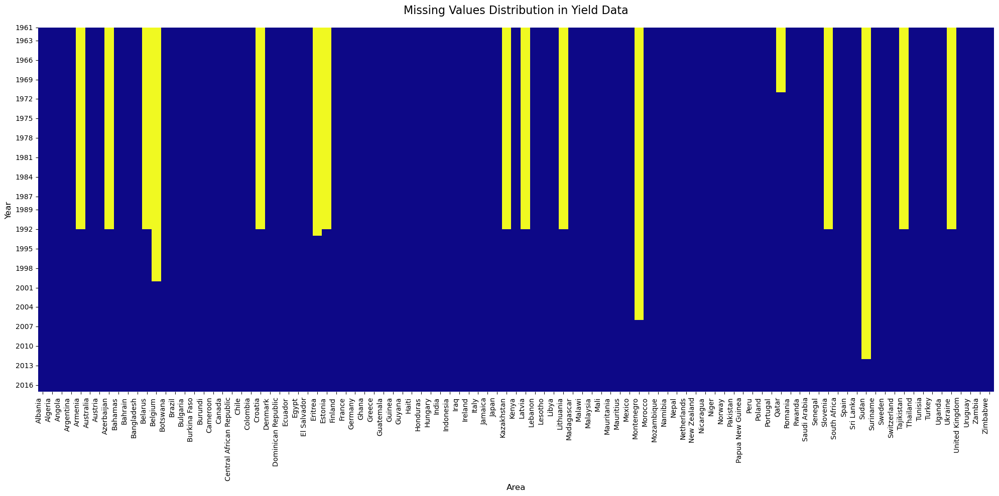

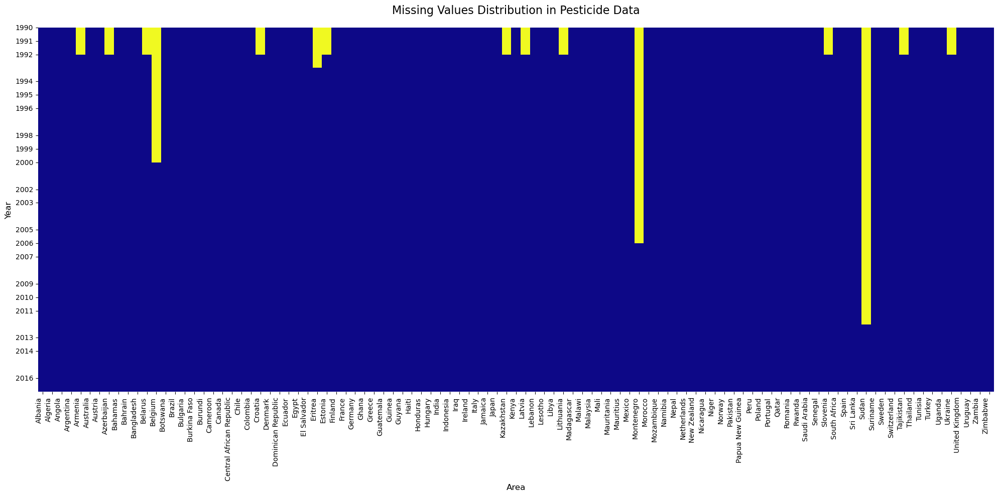

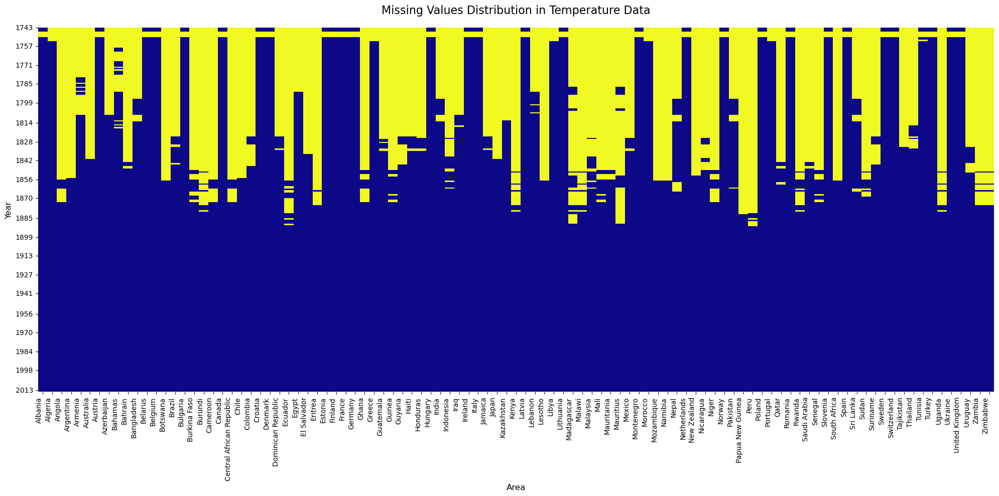

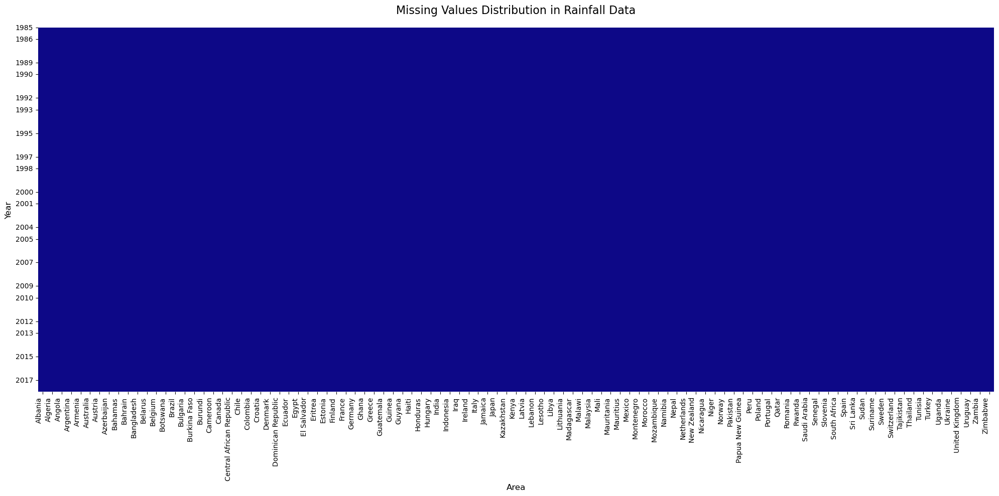

In [16]:
print("Yield Dataset Description:")
print(yield_data_filtered.describe())
print("Pesticides Dataset Description:")
print(pesticides_data_filtered.describe())
print("Temperature Dataset Description:")
print(df_temp_filtered.describe())
print("Rainfall Dataset Description:")
print(df_rainfall_filtered.describe())


# Function to plot missing value heatmaps
def plot_missing_heatmap(df, value_column, title, agg_method='first'):
    """
    Create a heatmap visualization of missing values across areas and years.

    Parameters:
    - df: Input DataFrame
    - value_column: Column containing the values to analyze
    - title: Title of the heatmap
    - agg_method: Method to aggregate duplicate entries (default: 'first')
    """
    # Validate input
    required_columns = ['Area', 'year', value_column]
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"Required column '{col}' not found in the DataFrame")

    # Select relevant columns
    df_subset = df[required_columns].copy()

    # Aggregate duplicates
    df_subset = df_subset.groupby(['Area', 'year'])[value_column].agg(agg_method).reset_index()

    # Create pivot table
    pivot = df_subset.pivot(index='year', columns='Area', values=value_column)

    # Create the plot
    plt.figure(figsize=(20, 10))

    # Generate heatmap of missing values
    sns.heatmap(pivot.isnull(),
                cbar=False,  # No color bar
                cmap='plasma',  # Color scheme
                xticklabels=True,
                yticklabels=True)

    # Customize plot
    plt.title(title, fontsize=16, pad=20)
    plt.xlabel('Area', fontsize=12)
    plt.ylabel('Year', fontsize=12)

    # Rotate x-axis labels for readability
    plt.xticks(rotation=90, ha='right')

    # Adjust y-axis ticks to prevent overcrowding
    num_years = pivot.shape[0]
    y_tick_locations = np.linspace(0, num_years-1, min(20, num_years)).astype(int)
    y_tick_labels = pivot.index[y_tick_locations]
    plt.yticks(y_tick_locations, y_tick_labels)

    # Ensure layout is tight
    plt.tight_layout()

    # Display the plot
    plt.show()

# Diagnostic Function to Check Duplicates
def diagnose_duplicates(df, columns):
    """
    Identify and print details about duplicate entries in specified columns.

    Parameters:
    - df: Input DataFrame
    - columns: List of columns to check for duplicates
    """
    duplicates = df[df.duplicated(subset=columns, keep=False)]

    print(f"Total duplicate entries: {len(duplicates)}")
    print("\nDuplicate Entries:")
    print(duplicates)

    # Groupby to see duplicate patterns
    duplicate_groups = duplicates.groupby(columns).size().reset_index(name='count')
    print("\nDuplicate Groups:")
    print(duplicate_groups[duplicate_groups['count'] > 1])

# Plot Missing Value Heatmaps
plot_missing_heatmap(yield_data_filtered, 'Value', 'Missing Values Distribution in Yield Data')
plot_missing_heatmap(pesticides_data_filtered, 'Value', 'Missing Values Distribution in Pesticide Data')
plot_missing_heatmap(df_temp_filtered, 'avg_temp', 'Missing Values Distribution in Temperature Data')
plot_missing_heatmap(df_rainfall_filtered, 'average_rain_fall_mm_per_year', 'Missing Values Distribution in Rainfall Data')


Original Dataset Sizes:
Yield Data: 29965 → 13711
Pesticides Data: 2654 → 2351
Temperature Data: 40990 → 4728
Rainfall Data: 3131 → 2323


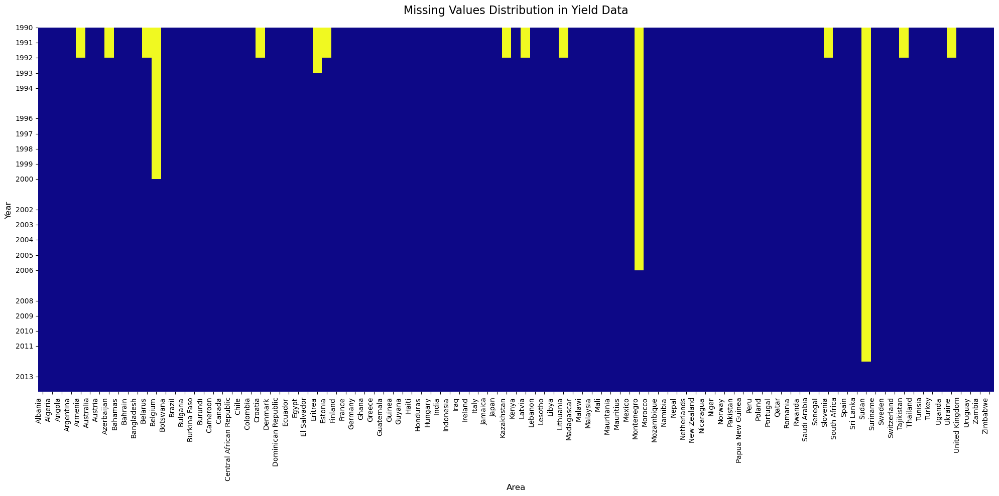

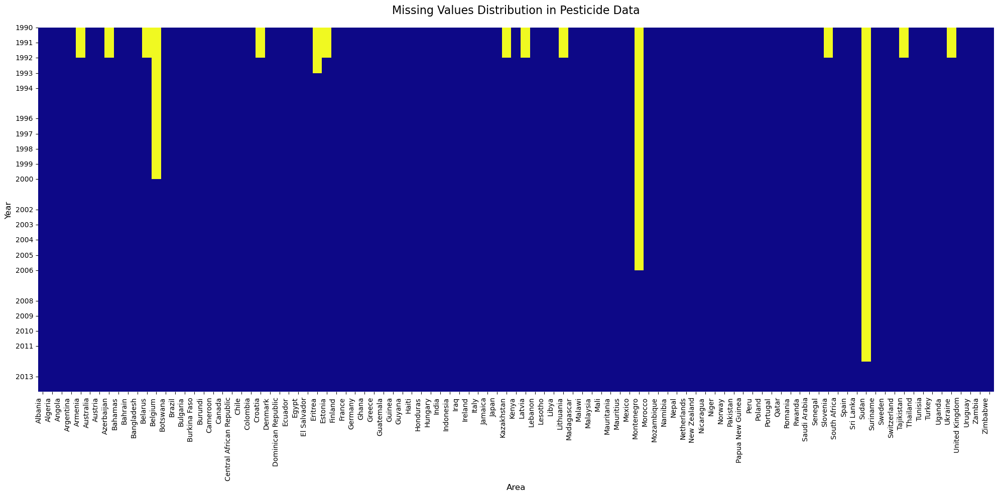

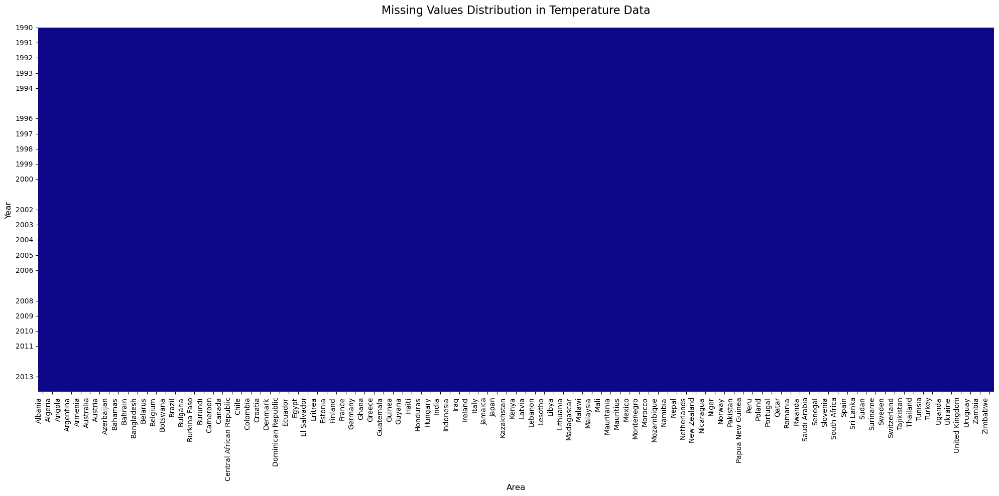

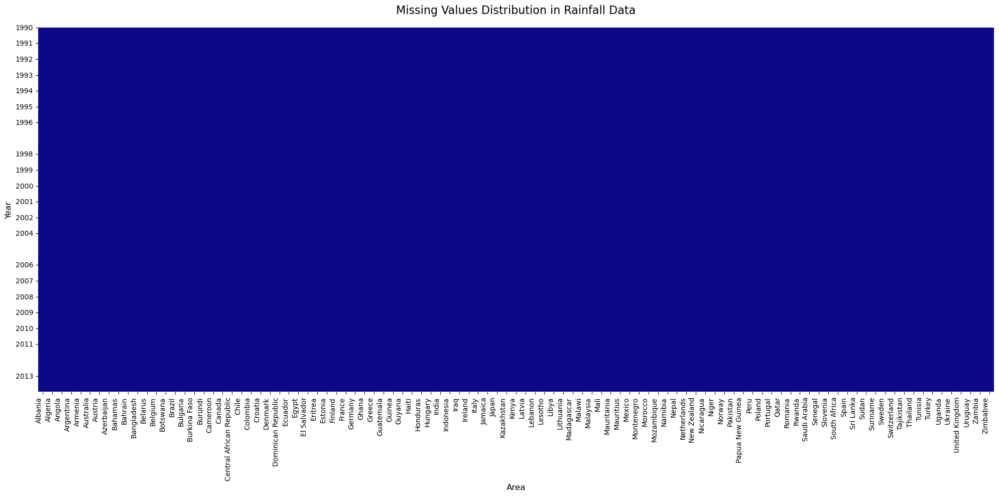

In [17]:
# Filter datasets for years between 1990 and 2013
df_yield_cleaned = yield_data_filtered[(yield_data_filtered['year'] >= 1990) & (yield_data_filtered['year'] <= 2013)]
df_pesticides_cleaned = pesticides_data_filtered[(pesticides_data_filtered['year'] >= 1990) & (pesticides_data_filtered['year'] <= 2013)]
df_temp_cleaned = df_temp_filtered[(df_temp_filtered['year'] >= 1990) & (df_temp_filtered['year'] <= 2013)]
df_rainfall_cleaned = df_rainfall_filtered[(df_rainfall_filtered['year'] >= 1990) & (df_rainfall_filtered['year'] <= 2013)]

# Display the number of records in each filtered dataset
print("\nOriginal Dataset Sizes:")
print("Yield Data:", len(yield_data_filtered), "→", len(df_yield_cleaned))
print("Pesticides Data:", len(pesticides_data_filtered), "→", len(df_pesticides_cleaned))
print("Temperature Data:", len(df_temp_filtered), "→", len(df_temp_cleaned))
print("Rainfall Data:", len(df_rainfall_filtered), "→", len(df_rainfall_cleaned))


# Function to plot missing value heatmaps
def plot_missing_heatmap(df, value_column, title, agg_method='first'):
    """
    Create a heatmap visualization of missing values across areas and years.

    Parameters:
    - df: Input DataFrame
    - value_column: Column containing the values to analyze
    - title: Title of the heatmap
    - agg_method: Method to aggregate duplicate entries (default: 'first')
    """
    # Validate input
    required_columns = ['Area', 'year', value_column]
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"Required column '{col}' not found in the DataFrame")

    # Select relevant columns
    df_subset = df[required_columns].copy()

    # Aggregate duplicates
    df_subset = df_subset.groupby(['Area', 'year'])[value_column].agg(agg_method).reset_index()

    # Create pivot table
    pivot = df_subset.pivot(index='year', columns='Area', values=value_column)

    # Create the plot
    plt.figure(figsize=(20, 10))

    # Generate heatmap of missing values
    sns.heatmap(pivot.isnull(),
                cbar=False,  # No color bar
                cmap='plasma',  # Color scheme
                xticklabels=True,
                yticklabels=True)

    # Customize plot
    plt.title(title, fontsize=16, pad=20)
    plt.xlabel('Area', fontsize=12)
    plt.ylabel('Year', fontsize=12)

    # Rotate x-axis labels for readability
    plt.xticks(rotation=90, ha='right')

    # Adjust y-axis ticks to prevent overcrowding
    num_years = pivot.shape[0]
    y_tick_locations = np.linspace(0, num_years-1, min(20, num_years)).astype(int)
    y_tick_labels = pivot.index[y_tick_locations]
    plt.yticks(y_tick_locations, y_tick_labels)

    # Ensure layout is tight
    plt.tight_layout()

    # Display the plot
    plt.show()

# Diagnostic Function to Check Duplicates
def diagnose_duplicates(df, columns):
    """
    Identify and print details about duplicate entries in specified columns.

    Parameters:
    - df: Input DataFrame
    - columns: List of columns to check for duplicates
    """
    duplicates = df[df.duplicated(subset=columns, keep=False)]

    print(f"Total duplicate entries: {len(duplicates)}")
    print("\nDuplicate Entries:")
    print(duplicates)

    # Groupby to see duplicate patterns
    duplicate_groups = duplicates.groupby(columns).size().reset_index(name='count')
    print("\nDuplicate Groups:")
    print(duplicate_groups[duplicate_groups['count'] > 1])


# Plot Missing Value Heatmaps
plot_missing_heatmap(df_yield_cleaned, 'Value', 'Missing Values Distribution in Yield Data')
plot_missing_heatmap(df_pesticides_cleaned, 'Value', 'Missing Values Distribution in Pesticide Data')
plot_missing_heatmap(df_temp_cleaned, 'avg_temp', 'Missing Values Distribution in Temperature Data')
plot_missing_heatmap(df_rainfall_cleaned, 'average_rain_fall_mm_per_year', 'Missing Values Distribution in Rainfall Data')

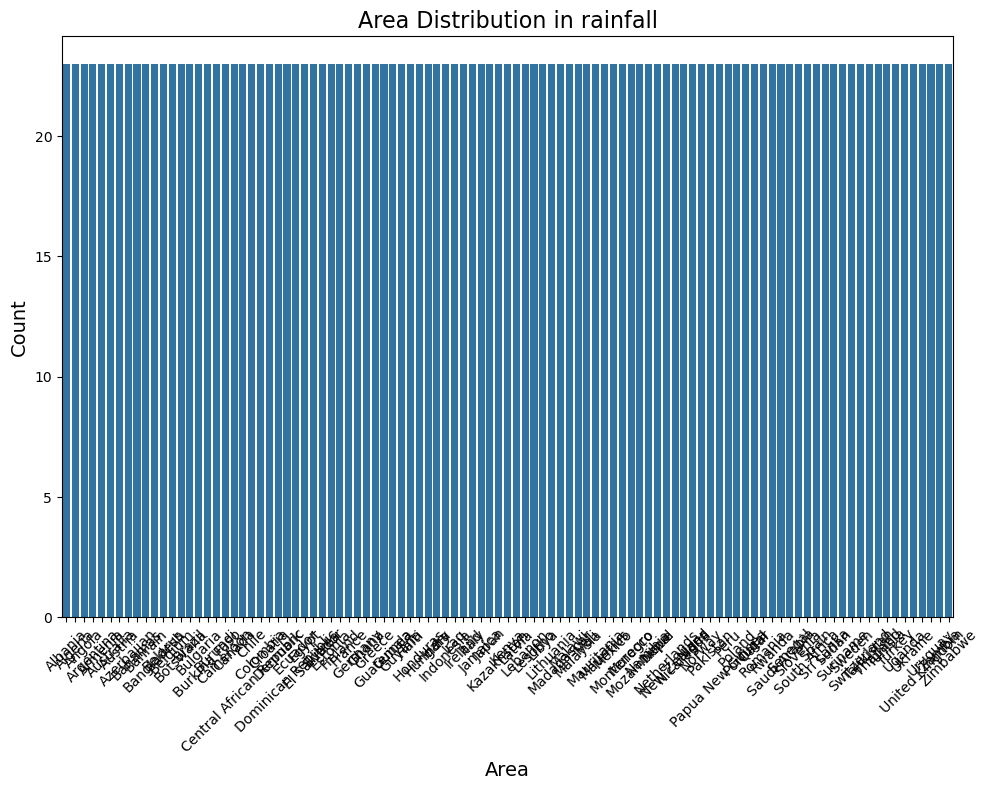

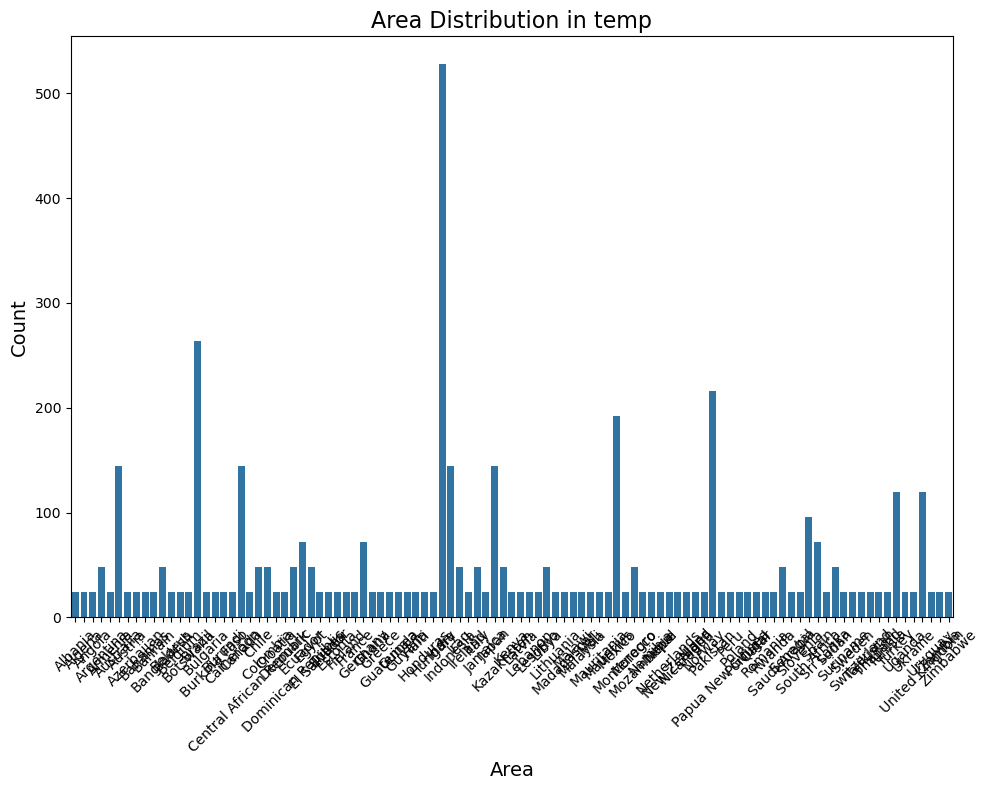

In [18]:
plt.figure(figsize=(10, 8))
sns.countplot(data=df_rainfall_cleaned, x="Area")
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution in rainfall', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
sns.countplot(data=df_temp_cleaned, x="Area")
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution in temp', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



4728 → 2424
              year     avg_temp
count  2424.000000  2424.000000
mean   2001.500000    18.305231
std       6.923615     7.412559
min    1990.000000     1.300000
25%    1995.750000    10.807500
50%    2001.500000    19.660000
75%    2007.250000    25.402500
max    2013.000000    30.420000
              year  average_rain_fall_mm_per_year
count  2323.000000                    2323.000000
mean   2001.434783                    1062.613861
std       7.065367                     724.223615
min    1990.000000                      51.000000
25%    1995.000000                     589.000000
50%    2001.000000                     847.000000
75%    2008.000000                    1513.000000
max    2013.000000                    3240.000000


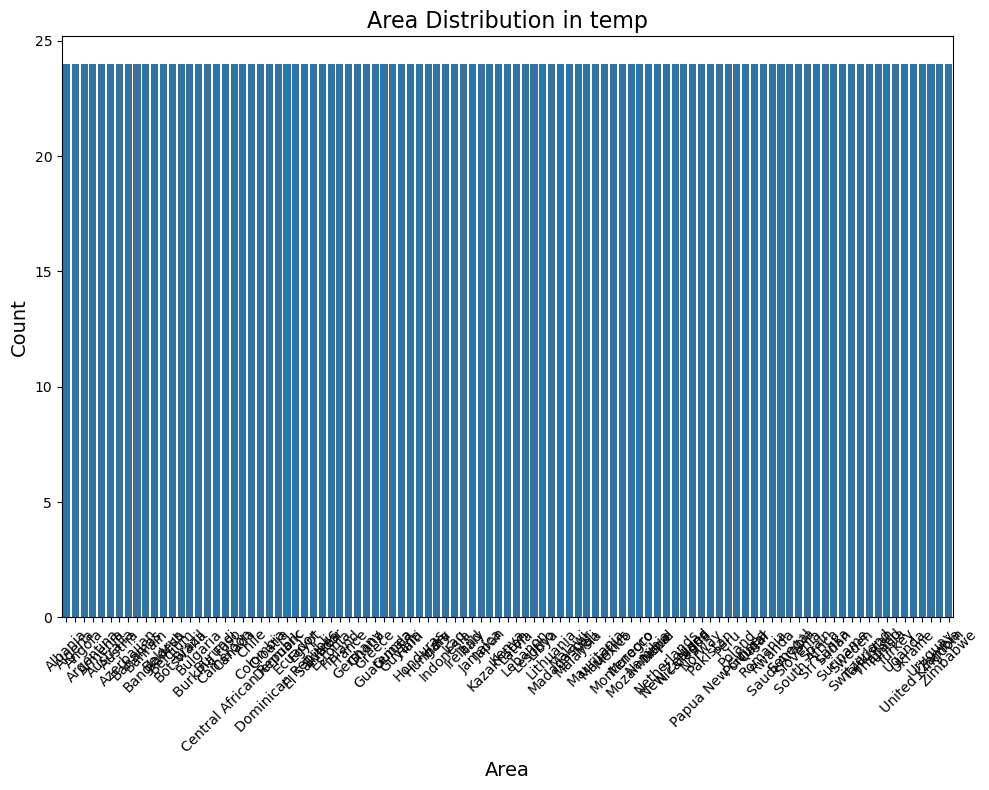

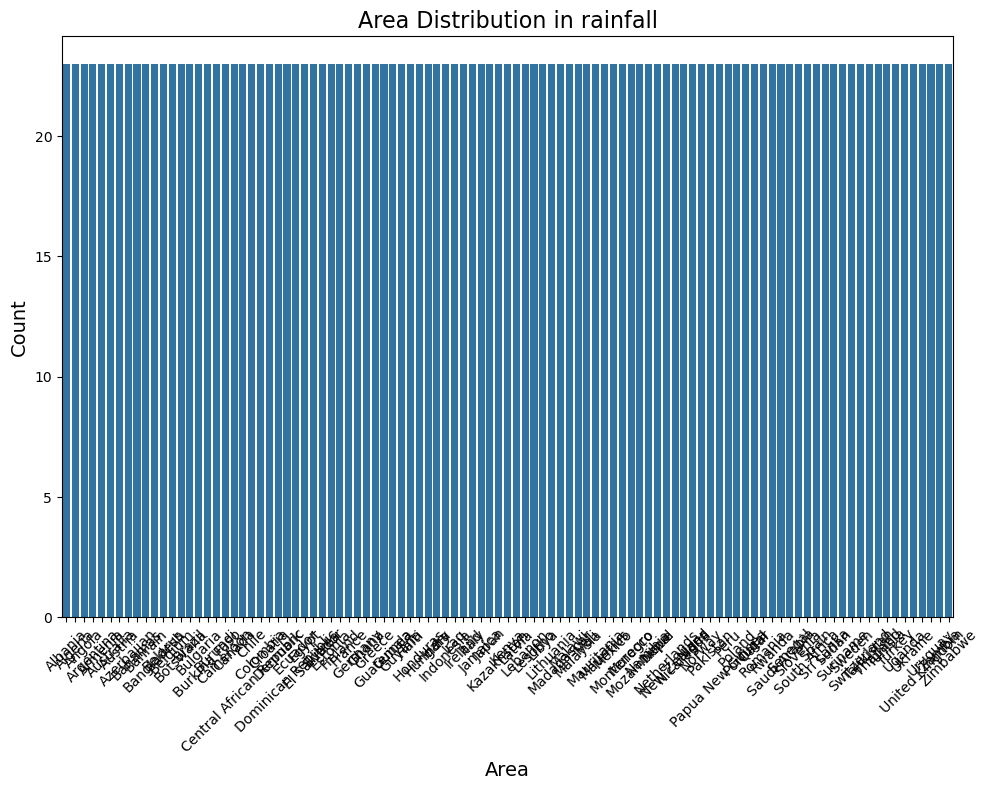

In [19]:
# average temperature by year and area
df_average_temp_cleaned = df_temp_cleaned.groupby(['year', 'Area'])['avg_temp'].mean().reset_index()
print(len(df_temp_cleaned), "→", len(df_average_temp_cleaned))

print(df_average_temp_cleaned.describe())
print(df_rainfall_cleaned.describe())

plt.figure(figsize=(10, 8))
sns.countplot(data=df_average_temp_cleaned, x="Area")
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution in temp', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
sns.countplot(data=df_rainfall_cleaned, x="Area")
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution in rainfall', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



In [20]:
def add_2003_from_2002_once(df):
    """
    Add a row for the year 2003 to each area using the rainfall value from 2002,
    ensuring 2003 rows are only added once.

    Parameters:
    - df (pandas.DataFrame): Input DataFrame.

    Returns:
    - pandas.DataFrame: Updated DataFrame with 2003 data added if not already present.
    """
    # Check if 2003 already exists in the DataFrame
    if 2003 in df['year'].values:
        print("2003 data already exists. No rows added.")
        return df

    # Filter 2002 data
    data_2002 = df[df['year'] == 2002]

    # Create new rows for 2003 by duplicating 2002 data and updating the year
    new_rows = data_2002.copy()
    new_rows['year'] = 2003

    # Concatenate new rows with the original DataFrame
    updated_df = pd.concat([df, new_rows], ignore_index=True).sort_values(['Area', 'year'])

    return updated_df

# Apply the function to the rainfall dataset
df_rainfall_cleaned = add_2003_from_2002_once(df_rainfall_cleaned)

# Save the updated DataFrame
df_rainfall_cleaned.to_csv('rainfall_cleaned.csv', index=False)

# Display summary
print("Rows added for 2003:")
print(df_rainfall_cleaned[df_rainfall_cleaned['year'] == 2003])
print("\nTotal rows in updated dataset:", len(df_rainfall_cleaned))
print("\nUnique years in dataset:", sorted(df_rainfall_cleaned['year'].unique()))


# Merge datasets on 'year' and 'Area'
df_rainfall_average_tempmerged_data = pd.merge(df_rainfall_cleaned, df_average_temp_cleaned, on=['year', 'Area'], how='inner')
df_rainfall_average_tempmerged_data.to_csv("rainfall_temperature_cleaned.csv", index=False)

Rows added for 2003:
                Area  year  average_rain_fall_mm_per_year
2323         Albania  2003                         1485.0
2324         Algeria  2003                           89.0
2325          Angola  2003                         1010.0
2326       Argentina  2003                          591.0
2327         Armenia  2003                          562.0
...              ...   ...                            ...
2419         Ukraine  2003                          565.0
2420  United Kingdom  2003                         1220.0
2421         Uruguay  2003                         1300.0
2422          Zambia  2003                         1020.0
2423        Zimbabwe  2003                          657.0

[101 rows x 3 columns]

Total rows in updated dataset: 2424

Unique years in dataset: [1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013]


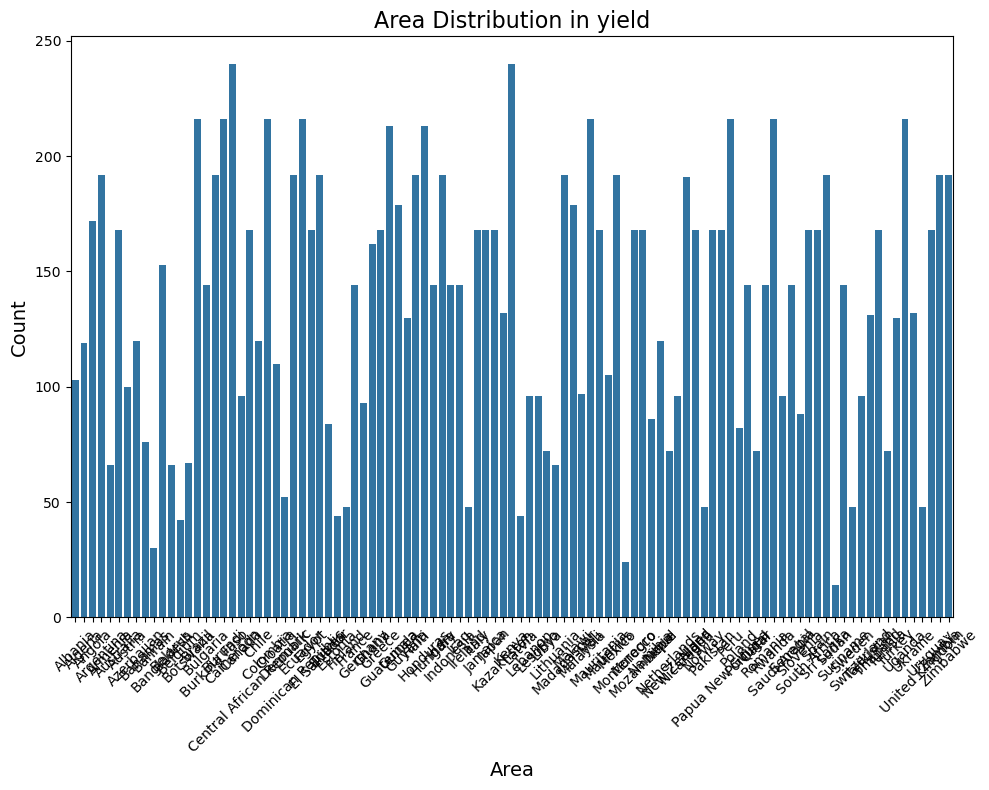

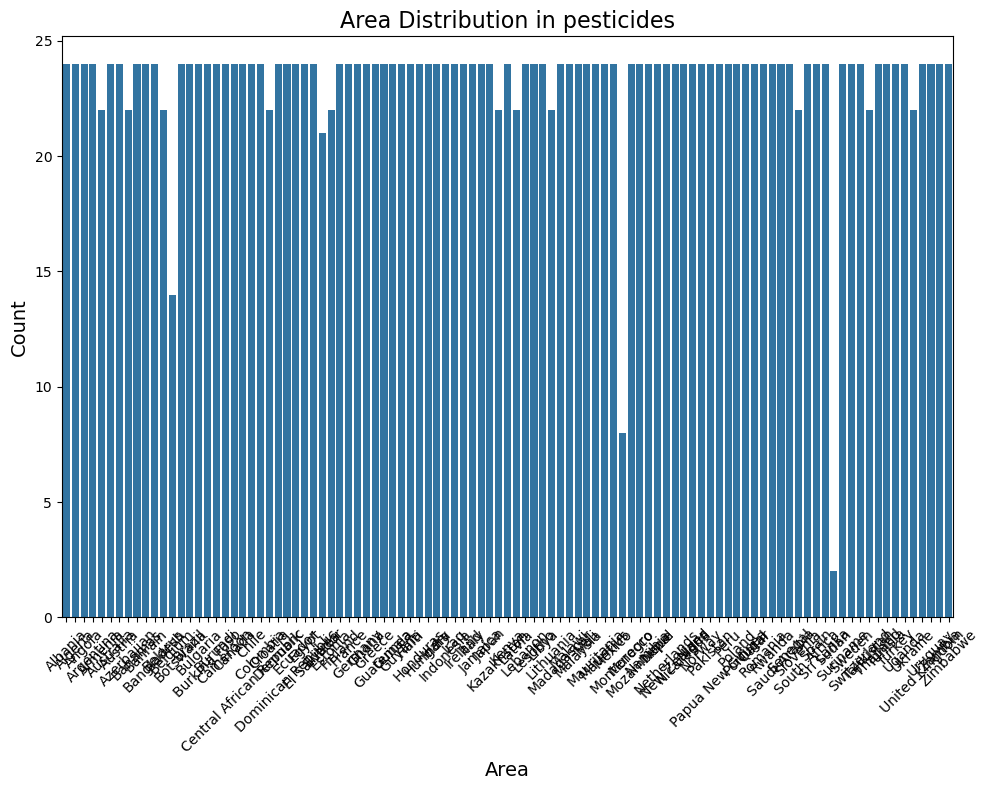

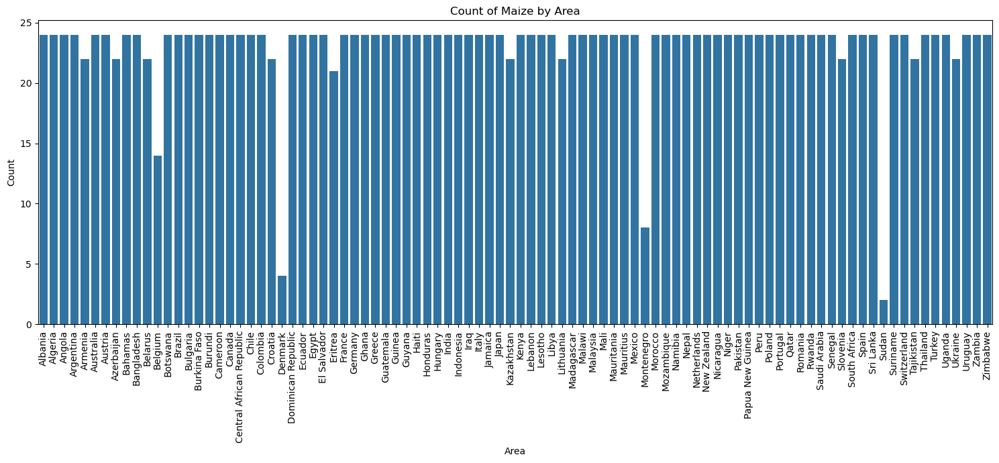

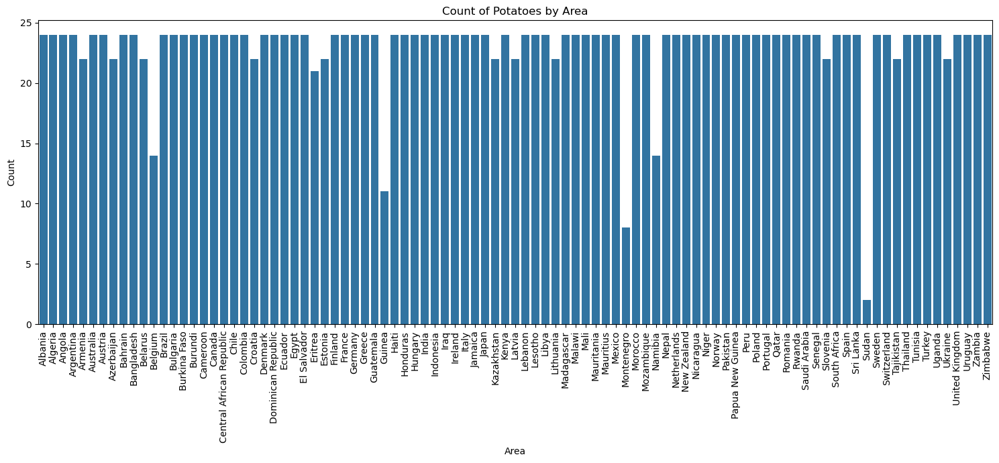

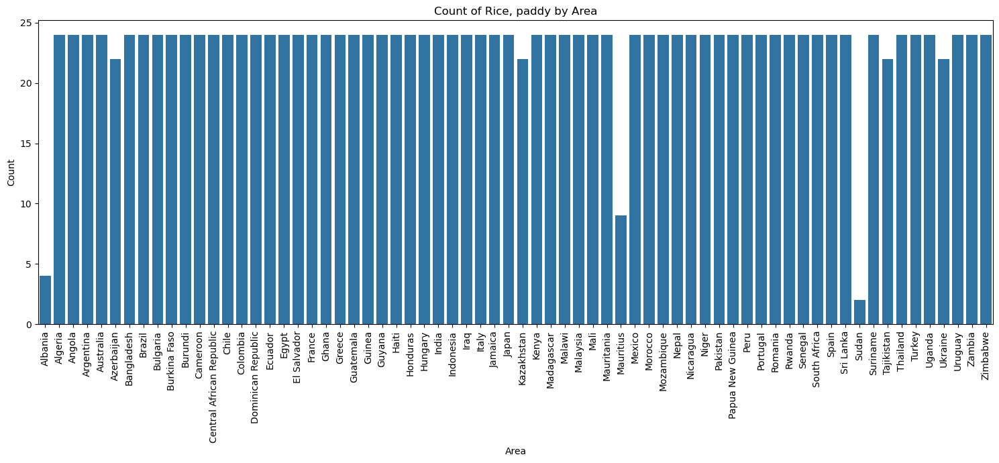

...

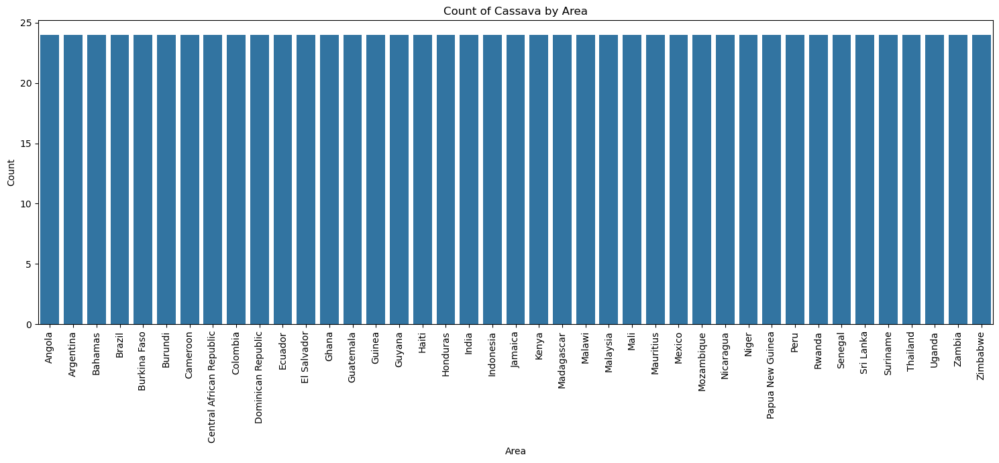

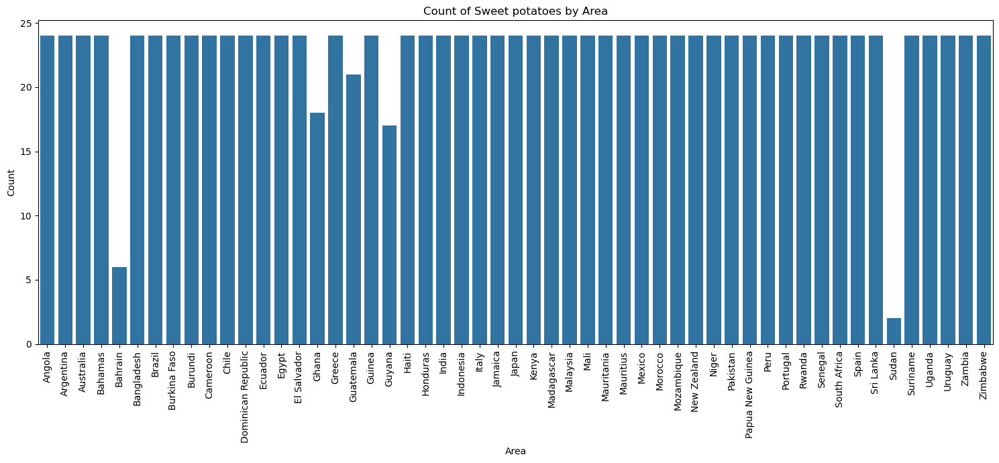

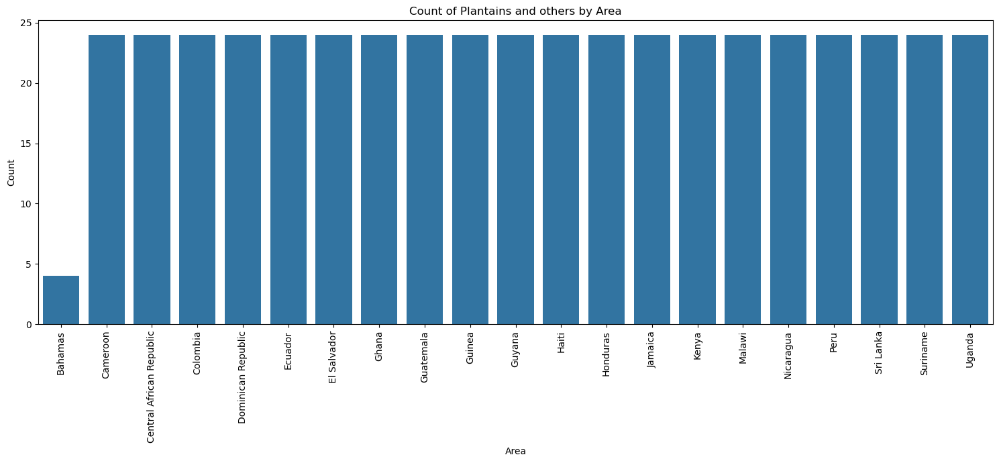

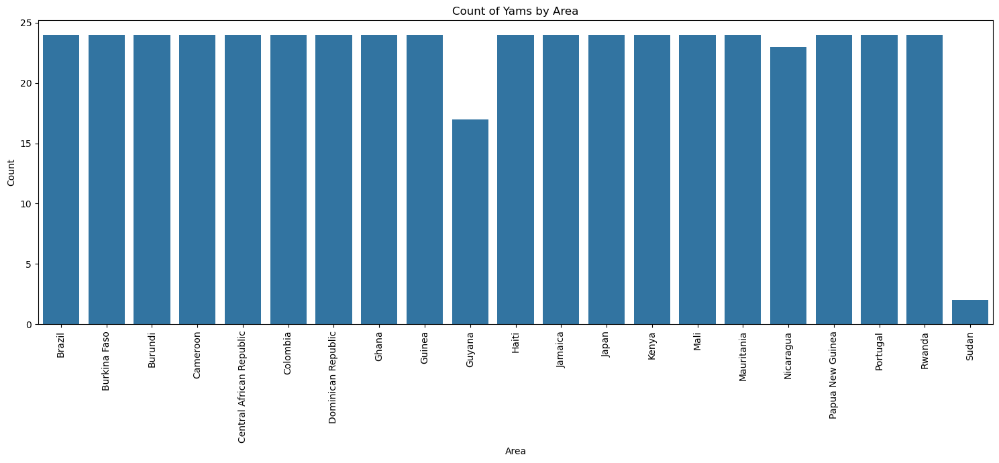

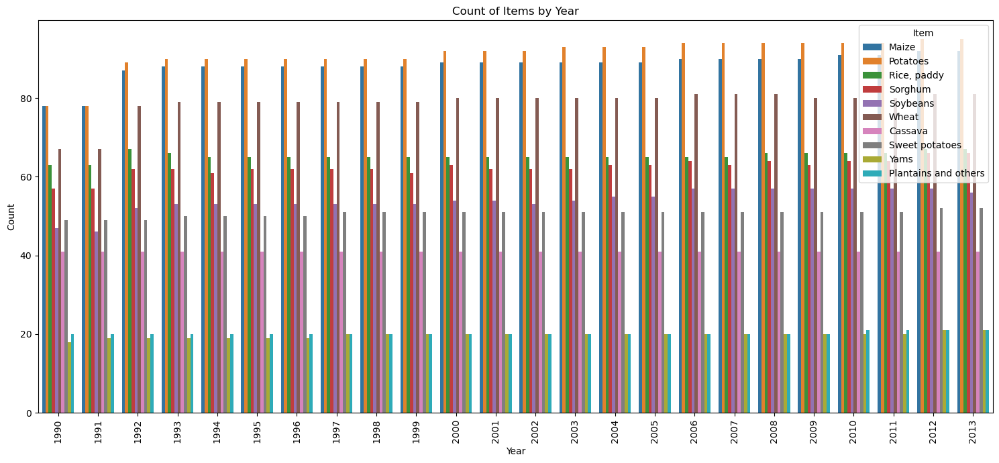

In [21]:

plt.figure(figsize=(10, 8))
sns.countplot(data=df_yield_cleaned, x="Area")
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution in yield', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
sns.countplot(data=df_pesticides_cleaned, x="Area")
plt.xlabel('Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Area Distribution in pesticides', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

def plot_countplots(df):
    """
    Create separate countplots for each unique Item in the Yield dataset with Area as x-axis.

    Parameters:
    - df (pandas.DataFrame): Input Yield DataFrame.

    Returns:
    - None: Displays the plots.
    """
    unique_items = df['Item'].unique()  # Get unique items
    for item in unique_items:
        plt.figure(figsize=(15, 7))

        # Filter data for the current item
        item_data = df[df['Item'] == item]

        # Plot Area vs Count
        sns.countplot(data=item_data, x="Area")
        plt.xlabel("Area")
        plt.ylabel("Count")
        plt.title(f"Count of {item} by Area")
        plt.xticks(rotation=90)

        # Display the plot
        plt.tight_layout()
        plt.show()


    # Countplot for Year vs Item count
    plt.figure(figsize=(15, 7))
    sns.countplot(data=df, x="year", hue="Item")
    plt.xlabel("Year")
    plt.ylabel("Count")
    plt.title("Count of Items by Year")
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()

# Apply the function to the Yield dataset
plot_countplots(df_yield_cleaned)



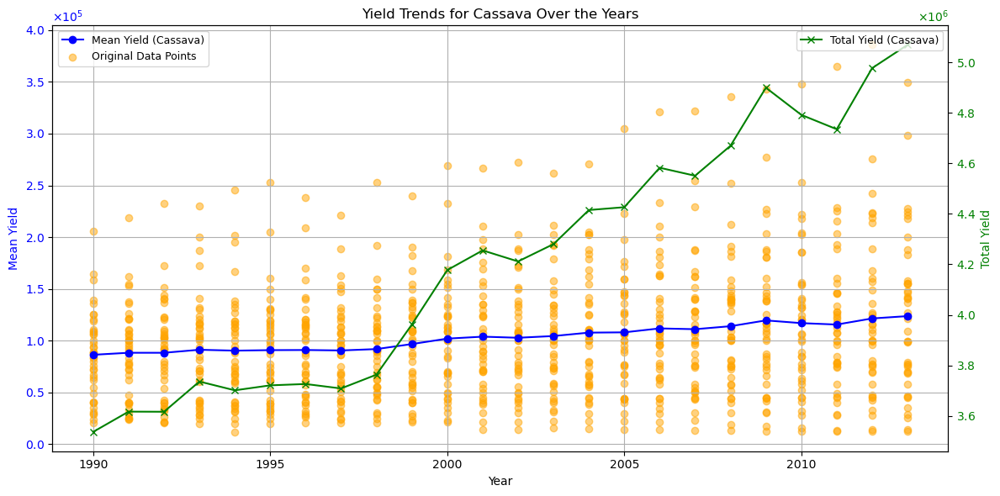

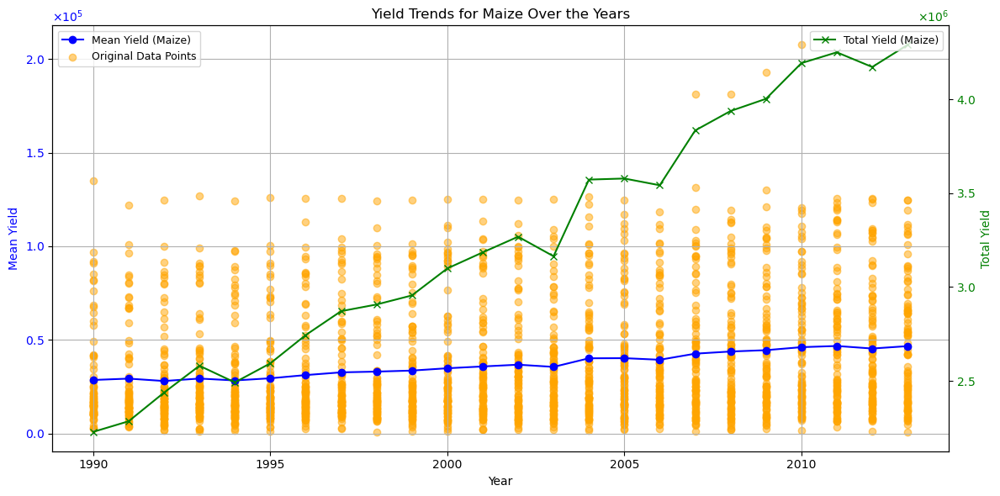

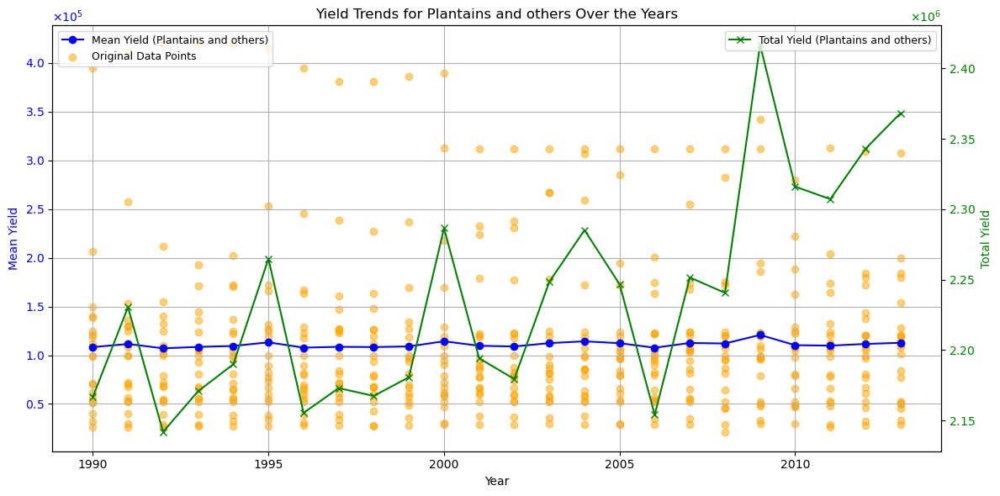

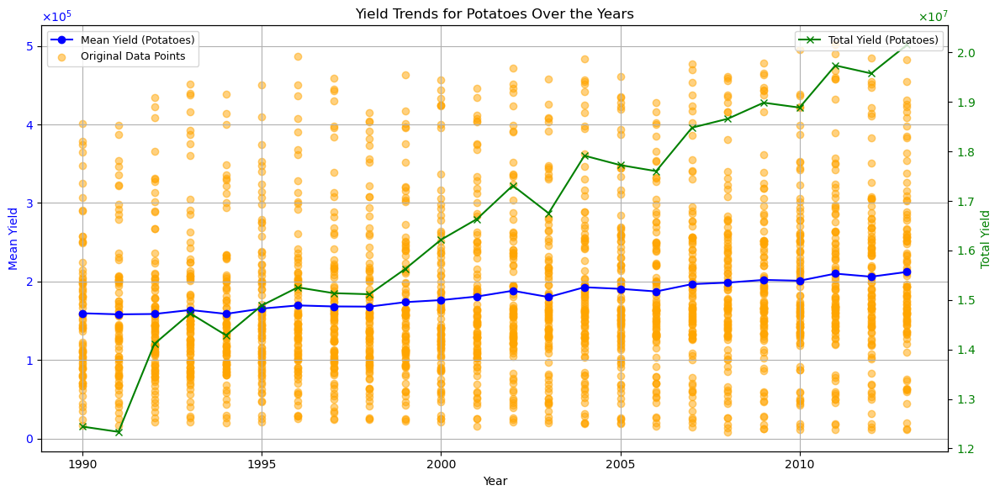

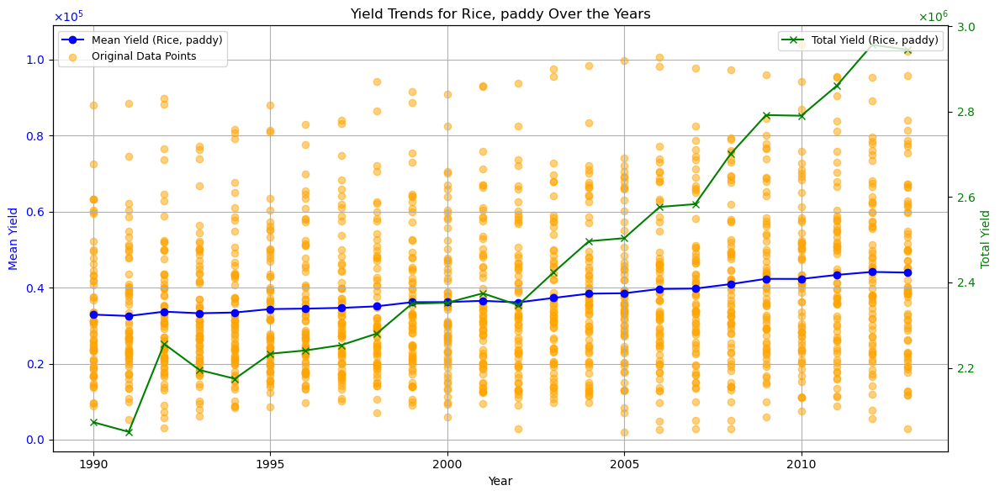

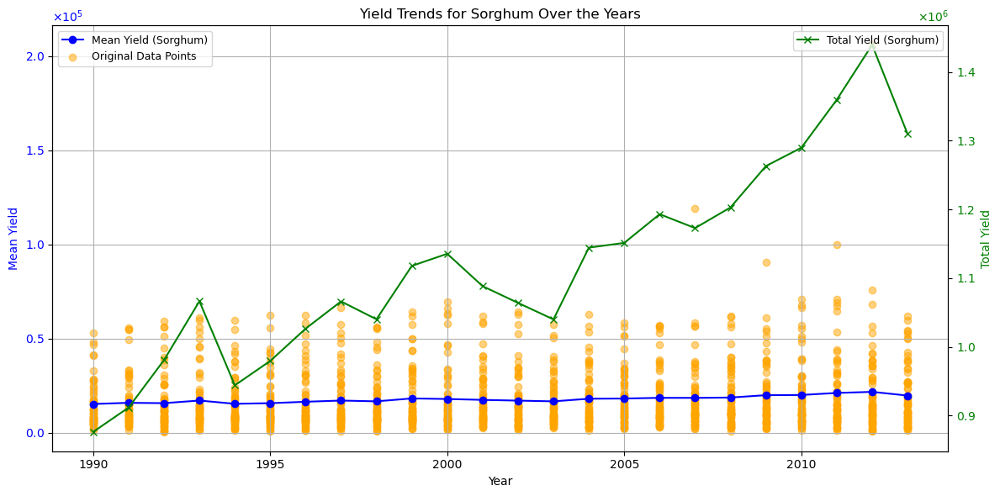

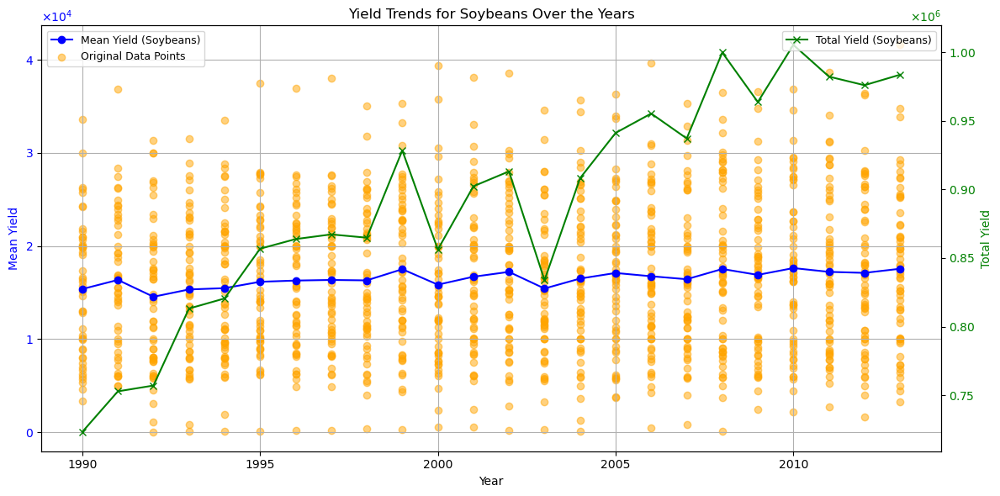

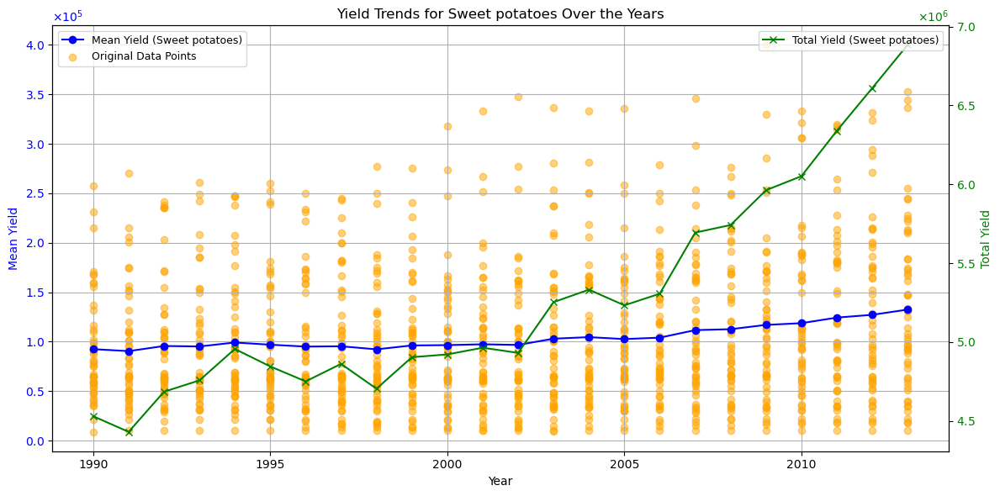

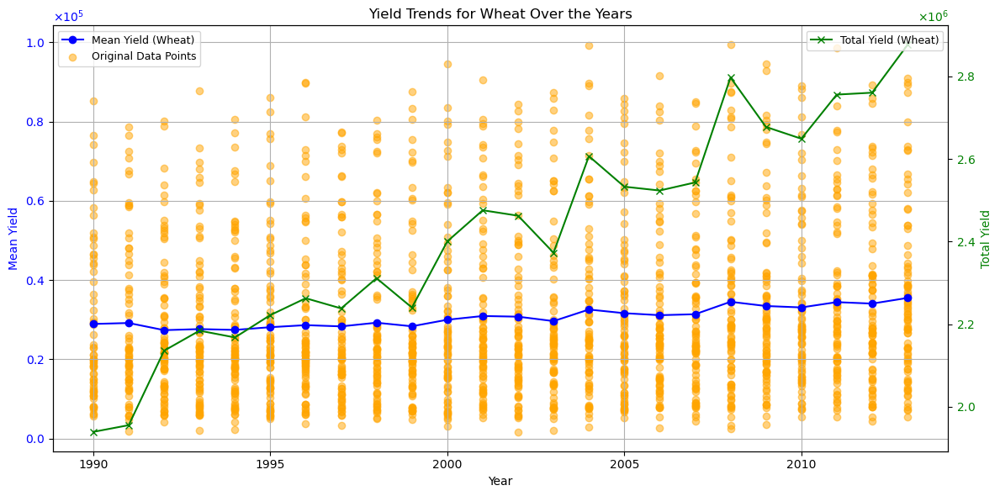

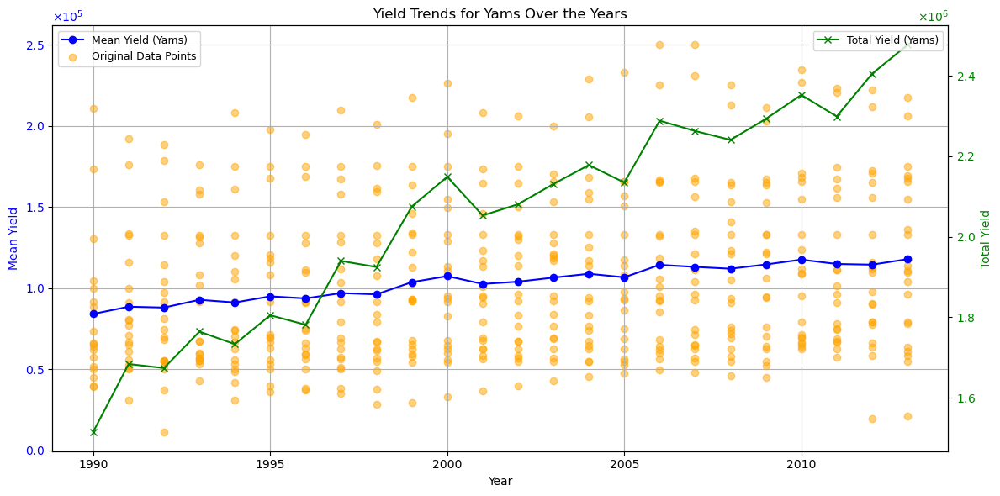

In [22]:
import matplotlib.ticker as mticker

def plot_yield_trend_with_total_on_secondary_axis(df):
    """
    Create trend plots for total yield and mean yield of each crop (Item) over the years,
    with original data points displayed and total yield on a secondary Y-axis.
    Both Y-axes are displayed in scientific notation.

    Parameters:
    - df (pandas.DataFrame): Input DataFrame with columns ['Area', 'Item', 'year', 'Value'].

    Returns:
    - None: Displays the plots.
    """
    # Group data by Item and year, calculating both total and mean yield
    grouped_data = df.groupby(['Item', 'year'])['Value'].agg(['sum', 'mean']).reset_index()

    # Get unique items (crops)
    unique_items = grouped_data['Item'].unique()

    for item in unique_items:
        # Filter data for the current item
        item_grouped_data = grouped_data[grouped_data['Item'] == item]
        item_original_data = df[df['Item'] == item]

        # Create figure and axis
        fig, ax1 = plt.subplots(figsize=(12, 6))

        # Plot mean yield trend on primary Y-axis
        ax1.plot(item_grouped_data['year'], item_grouped_data['mean'], marker='o', label=f'Mean Yield ({item})', color='blue')
        ax1.scatter(item_original_data['year'], item_original_data['Value'], alpha=0.5, label='Original Data Points', color='orange')
        ax1.set_xlabel("Year")
        ax1.set_ylabel("Mean Yield", color='blue')
        ax1.tick_params(axis='y', labelcolor='blue')
        ax1.grid(True)

        # Format primary Y-axis in scientific notation
        ax1.yaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
        ax1.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))

        # Create secondary Y-axis for total yield
        ax2 = ax1.twinx()
        ax2.plot(item_grouped_data['year'], item_grouped_data['sum'], marker='x', label=f'Total Yield ({item})', color='green')
        ax2.set_ylabel("Total Yield", color='green')
        ax2.tick_params(axis='y', labelcolor='green')

        # Format secondary Y-axis in scientific notation
        ax2.yaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
        ax2.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))

        # Add legends
        ax1.legend(loc='upper left', fontsize=9)
        ax2.legend(loc='upper right', fontsize=9)

        # Add title
        plt.title(f"Yield Trends for {item} Over the Years")

        # Display the plot
        plt.tight_layout()
        plt.show()

# Apply the function to the Yield dataset
plot_yield_trend_with_total_on_secondary_axis(df_yield_cleaned)


Starting MICE imputation process...
Original shape: (13711, 4)
Expanded shape: (14352, 4)
Starting imputation...


c:\Users\Shang Huan\anaconda3\Lib\site-packages\sklearn\impute\_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



Data summary:
Original unique combinations: 598
Final unique combinations: 598

Crop counts before and after imputation:
                      Original  Filled  Difference
Item                                              
Cassava                    984     984           0
Maize                     2119    2208          89
Plantains and others       484     504          20
Potatoes                  2184    2280          96
Rice, paddy               1567    1632          65
Sorghum                   1497    1608         111
Soybeans                  1296    1392          96
Sweet potatoes            1216    1272          56
Wheat                     1890    1968          78
Yams                       474     504          30

Year coverage:
Original years: [1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013]
Filled years: [1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 20

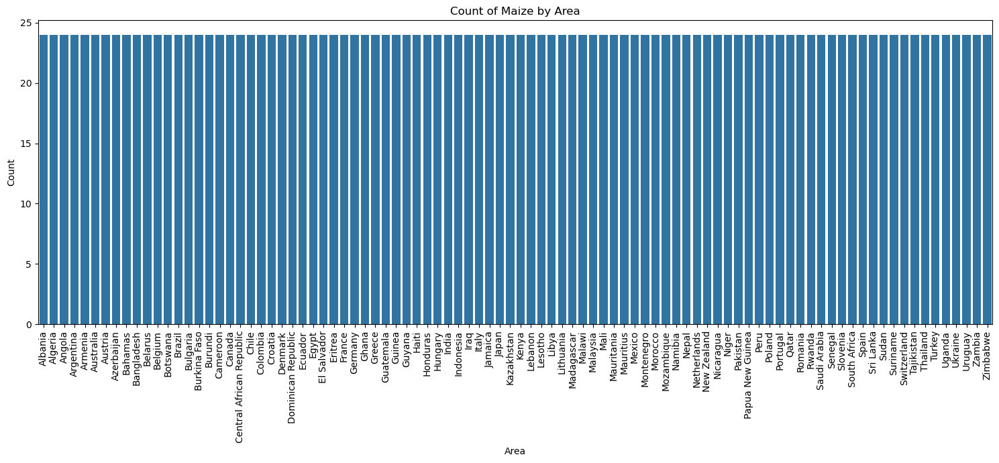

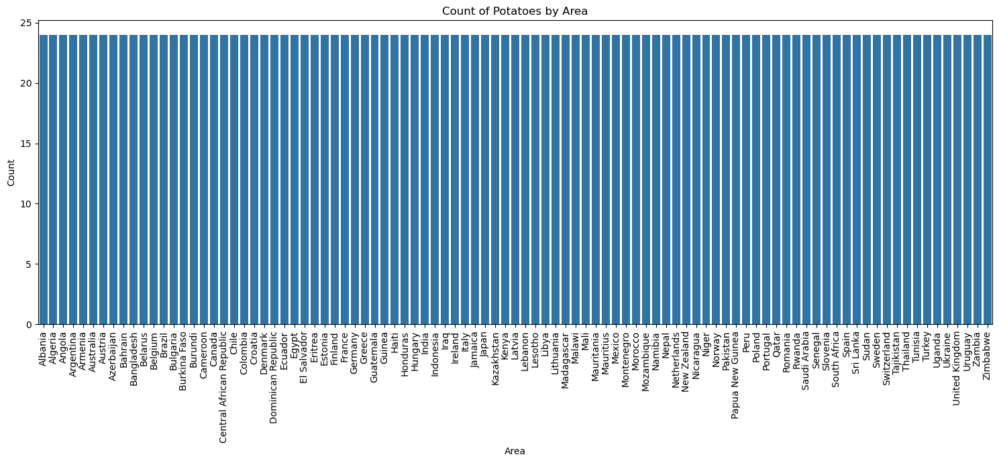

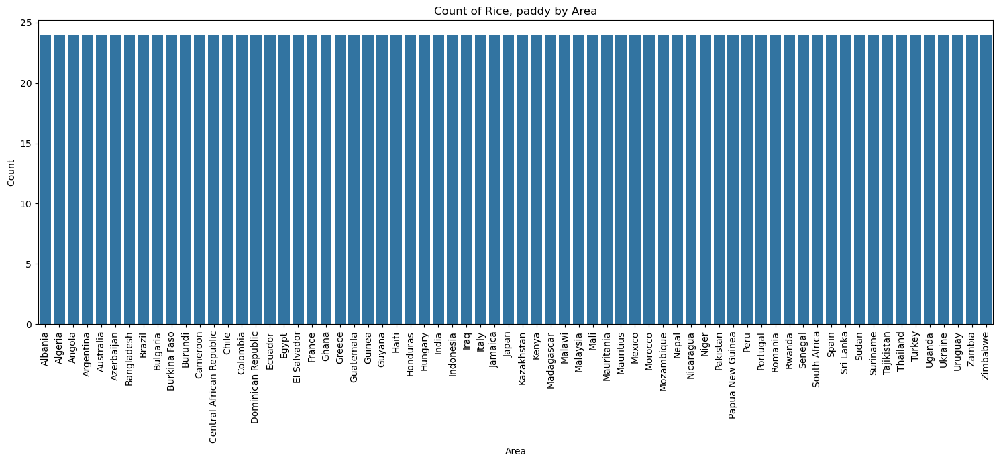

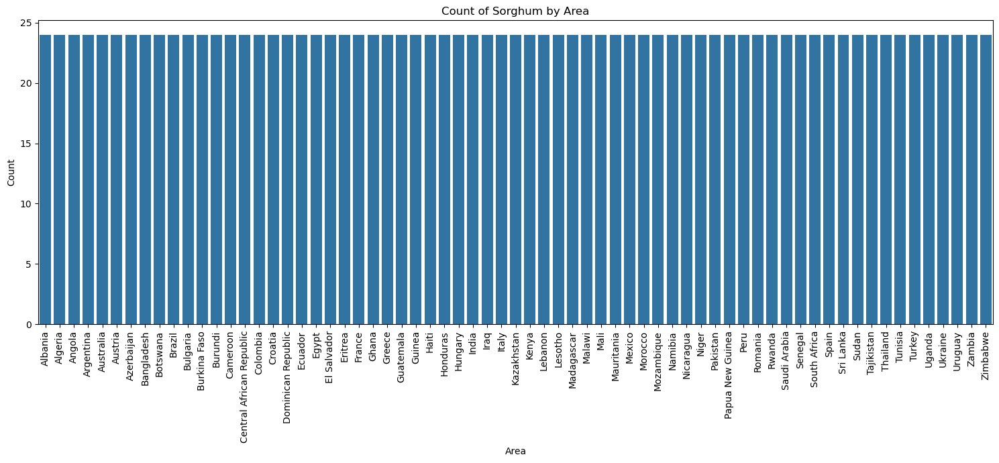

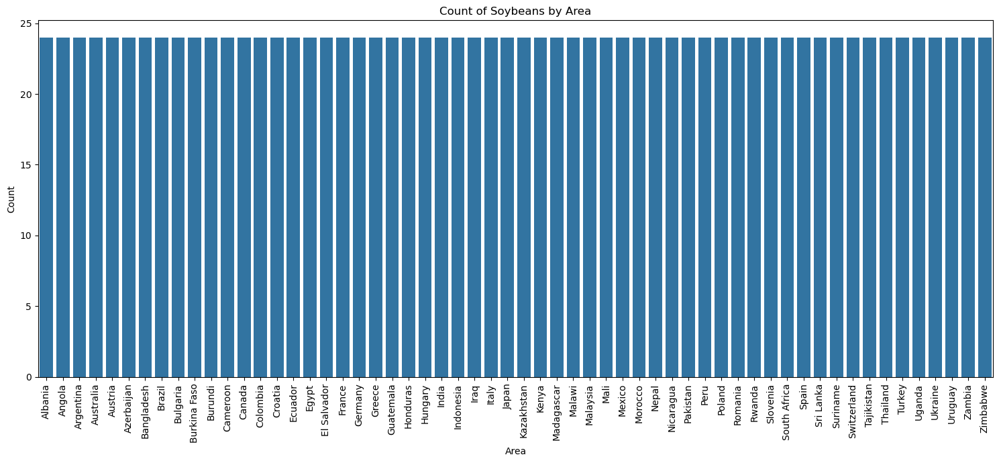

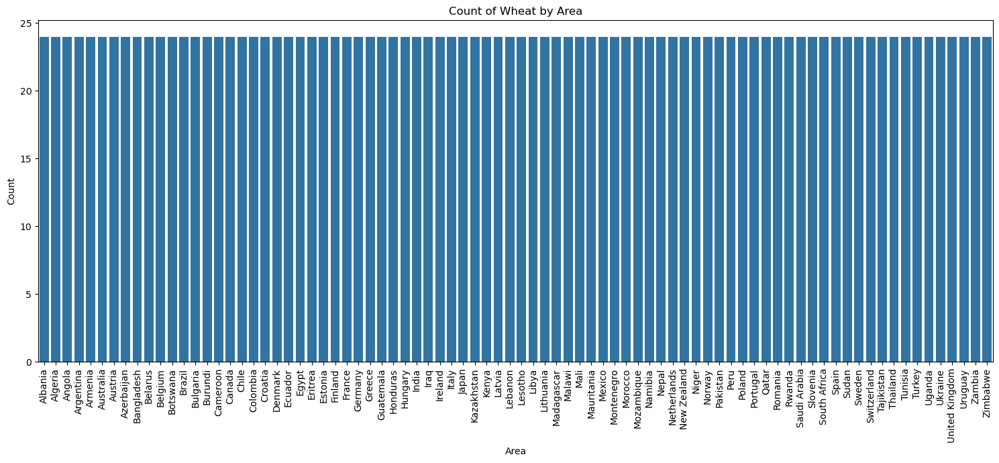

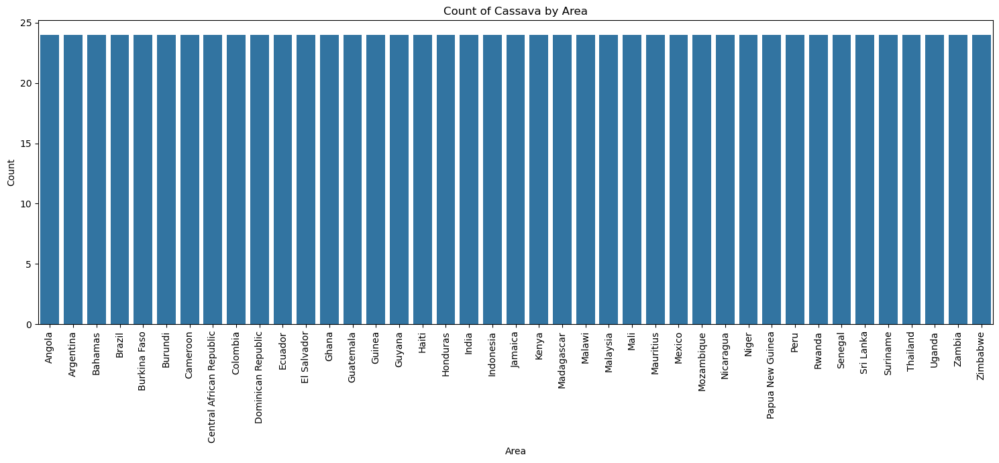

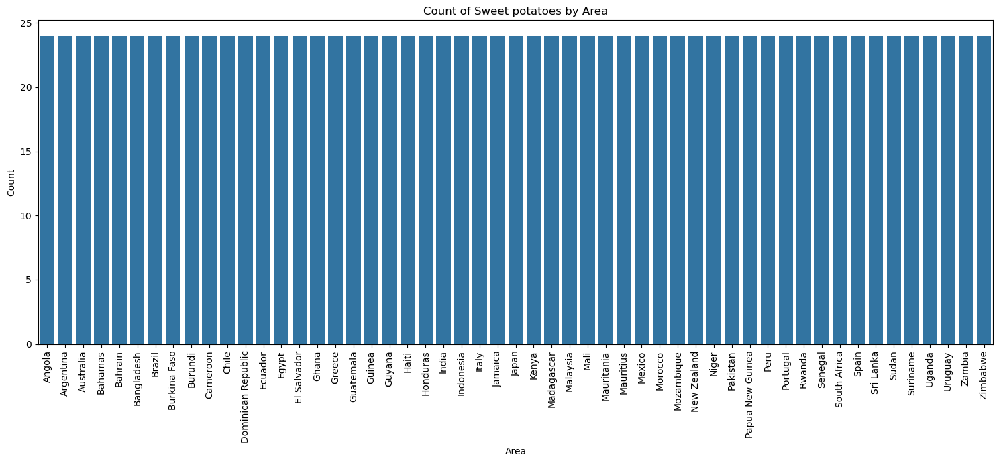

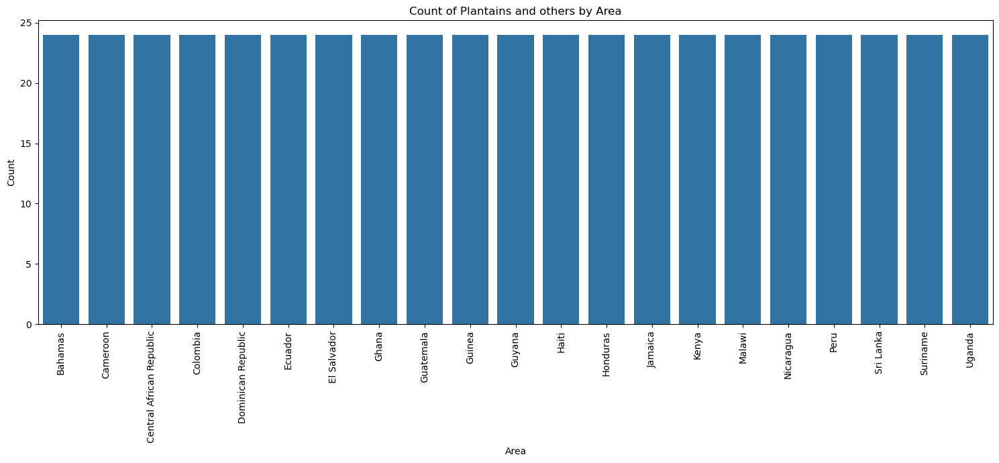

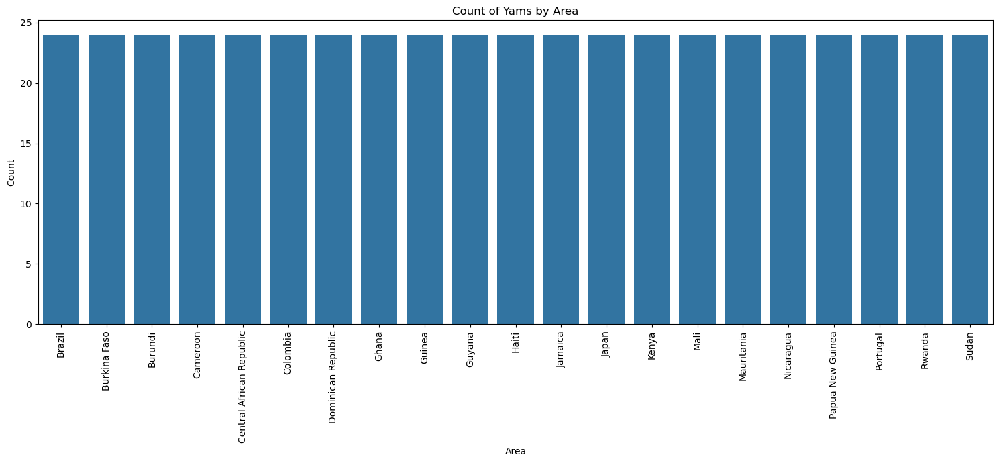

           Area   Item  year  Value
0       Albania  Maize  1990  36613
598     Albania  Maize  1991  29068
1196    Albania  Maize  1992  24876
1794    Albania  Maize  1993  24185
2392    Albania  Maize  1994  25848
...         ...    ...   ...    ...
11959  Zimbabwe  Wheat  2009  30000
12557  Zimbabwe  Wheat  2010  27681
13155  Zimbabwe  Wheat  2011  26274
13753  Zimbabwe  Wheat  2012  24420
14351  Zimbabwe  Wheat  2013  22888

[14352 rows x 4 columns]
           Area   Item  year  Value
253     Albania  Maize  1990  36613
254     Albania  Maize  1991  29068
255     Albania  Maize  1992  24876
256     Albania  Maize  1993  24185
257     Albania  Maize  1994  25848
...         ...    ...   ...    ...
56709  Zimbabwe  Wheat  2009  30000
56710  Zimbabwe  Wheat  2010  27681
56711  Zimbabwe  Wheat  2011  26274
56712  Zimbabwe  Wheat  2012  24420
56713  Zimbabwe  Wheat  2013  22888

[13711 rows x 4 columns]


In [23]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import LabelEncoder

def iterative_mice_imputation(df, target_column="Value"):
    """
    Enhanced MICE imputation with proper handling of crop-area combinations
    """
    df_copy = df.copy()
    
    # Get valid crop-area combinations
    valid_combinations = df_copy.groupby(['Area', 'Item']).size().reset_index()
    valid_combinations = valid_combinations[valid_combinations[0] > 0][['Area', 'Item']]
    
    # Get all years
    years = sorted(df_copy['year'].unique())
    
    # Create template with valid combinations
    template = pd.DataFrame([
        (row['Area'], row['Item'], year)
        for _, row in valid_combinations.iterrows()
        for year in years
    ], columns=['Area', 'Item', 'year'])
    
    # Merge with existing data
    df_expanded = pd.merge(
        template,
        df_copy,
        on=['Area', 'Item', 'year'],
        how='left'
    )
    
    print(f"Original shape: {df_copy.shape}")
    print(f"Expanded shape: {df_expanded.shape}")
    
    # Create pivot table
    pivot_df = df_expanded.pivot_table(
        index=['Area', 'Item'],
        columns='year',
        values=target_column,
        aggfunc='first'
    ).reset_index()
    
    # Convert column names to strings
    pivot_df.columns = pivot_df.columns.astype(str)
    
    # Separate metadata and values
    metadata = pivot_df[['Area', 'Item']]
    values = pivot_df.drop(['Area', 'Item'], axis=1).astype(float)
    
    # Initialize MICE imputer
    imputer = IterativeImputer(
        max_iter=100,
        random_state=42,
        min_value=0,
        initial_strategy='mean',
        tol=1e-3
    )
    
    # Perform imputation
    print("Starting imputation...")
    imputed_values = imputer.fit_transform(values)
    
    # Reconstruct DataFrame
    imputed_df = pd.DataFrame(
        imputed_values,
        columns=values.columns,
        index=values.index
    )
    
    # Combine results
    result_df = pd.concat([metadata, imputed_df], axis=1)
    result_df = result_df.melt(
        id_vars=['Area', 'Item'],
        var_name='year',
        value_name=target_column
    )
    
    # Clean up
    result_df['year'] = result_df['year'].astype(int)
    result_df[target_column] = result_df[target_column].clip(lower=0).round().astype(int)
    
    # Print summary statistics
    print("\nData summary:")
    print("Original unique combinations:", len(valid_combinations))
    print("Final unique combinations:", len(result_df[['Area', 'Item']].drop_duplicates()))
    
    return result_df.sort_values(['Area', 'Item', 'year'])

# Apply imputation
print("Starting MICE imputation process...")
df_yield_filled = iterative_mice_imputation(df_yield_cleaned)

# Compare crop counts
print("\nCrop counts before and after imputation:")
comparison = pd.DataFrame({
    'Original': df_yield_cleaned.groupby('Item').size(),
    'Filled': df_yield_filled.groupby('Item').size()
}).fillna(0)
comparison['Difference'] = comparison['Filled'] - comparison['Original']
print(comparison)

# Verify year coverage
print("\nYear coverage:")
print("Original years:", sorted(df_yield_cleaned['year'].unique()))
print("Filled years:", sorted(df_yield_filled['year'].unique()))




def plot_countplots(df):
    """
    Create separate countplots for each unique Item in the Yield dataset with Area as x-axis.

    Parameters:
    - df (pandas.DataFrame): Input Yield DataFrame.

    Returns:
    - None: Displays the plots.
    """
    unique_items = df['Item'].unique()  # Get unique items
    for item in unique_items:
        plt.figure(figsize=(15, 7))

        # Filter data for the current item
        item_data = df[df['Item'] == item]

        # Plot Area vs Count
        sns.countplot(data=item_data, x="Area")
        plt.xlabel("Area")
        plt.ylabel("Count")
        plt.title(f"Count of {item} by Area")
        plt.xticks(rotation=90)

        # Display the plot
        plt.tight_layout()
        plt.show()

# Apply the function to the Yield dataset
plot_countplots(df_yield_filled)

print(df_yield_filled)
print(df_yield_cleaned)



           Area   Item  year  Value
253     Albania  Maize  1990  36613
254     Albania  Maize  1991  29068
255     Albania  Maize  1992  24876
256     Albania  Maize  1993  24185
257     Albania  Maize  1994  25848
...         ...    ...   ...    ...
56709  Zimbabwe  Wheat  2009  30000
56710  Zimbabwe  Wheat  2010  27681
56711  Zimbabwe  Wheat  2011  26274
56712  Zimbabwe  Wheat  2012  24420
56713  Zimbabwe  Wheat  2013  22888

[13711 rows x 4 columns]
           Area   Item  year  Value
0       Albania  Maize  1990  36613
598     Albania  Maize  1991  29068
1196    Albania  Maize  1992  24876
1794    Albania  Maize  1993  24185
2392    Albania  Maize  1994  25848
...         ...    ...   ...    ...
11959  Zimbabwe  Wheat  2009  30000
12557  Zimbabwe  Wheat  2010  27681
13155  Zimbabwe  Wheat  2011  26274
13753  Zimbabwe  Wheat  2012  24420
14351  Zimbabwe  Wheat  2013  22888

[14352 rows x 4 columns]
=== Dataset Size Comparison ===
Original dataset size: (13711, 4)
Filled dataset siz

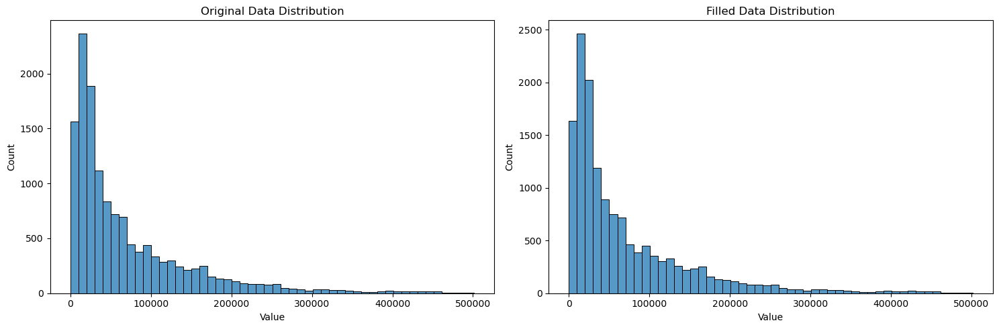

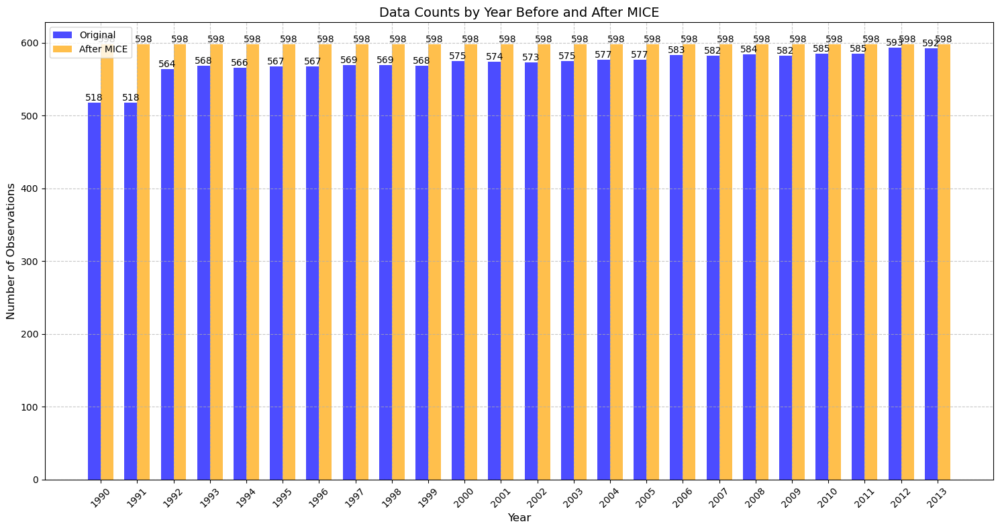


=== Value Ranges by Crop ===

Crop: Maize
Original range: min       849.0
max    207556.0
Name: Value, dtype: float64
Filled range: min       849.0
max    207556.0
Name: Value, dtype: float64

Crop: Potatoes
Original range: min      8406.0
max    501412.0
Name: Value, dtype: float64
Filled range: min      8406.0
max    501412.0
Name: Value, dtype: float64

Crop: Rice, paddy
Original range: min      2034.0
max    103895.0
Name: Value, dtype: float64
Filled range: min      2034.0
max    103895.0
Name: Value, dtype: float64

Crop: Sorghum
Original range: min       578.0
max    206000.0
Name: Value, dtype: float64
Filled range: min       578.0
max    206000.0
Name: Value, dtype: float64

Crop: Soybeans
Original range: min       50.0
max    41609.0
Name: Value, dtype: float64
Filled range: min       50.0
max    41609.0
Name: Value, dtype: float64

Crop: Wheat
Original range: min     1706.0
max    99387.0
Name: Value, dtype: float64
Filled range: min     1706.0
max    99387.0
Name: Value, d

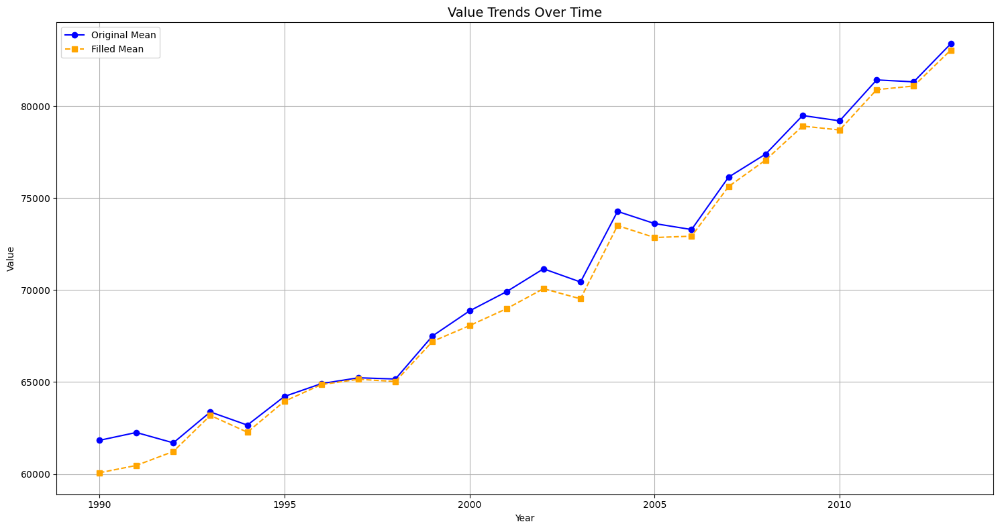

In [25]:
print(df_yield_cleaned)
print(df_yield_filled)


def compare_datasets(original_df, filled_df, value_column='Value'):
    """
    Compare original and filled datasets in detail
    
    Parameters:
    - original_df: Original dataframe
    - filled_df: Filled dataframe
    - value_column: Name of the value column to compare (default='Value')
    """
    # Check if the required column exists in both datasets
    if value_column not in original_df.columns or value_column not in filled_df.columns:
        raise ValueError(f"Column '{value_column}' not found in one of the datasets.")

    print("=== Dataset Size Comparison ===")
    print(f"Original dataset size: {original_df.shape}")
    print(f"Filled dataset size: {filled_df.shape}")
    
    # Compare basic statistics
    print("\n=== Basic Statistics Comparison ===")
    print("\nOriginal dataset:")
    print(original_df[value_column].describe())
    print("\nFilled dataset:")
    print(filled_df[value_column].describe())
    
    # Visualization comparison
    plt.figure(figsize=(15, 5))
    
    # Original data distribution
    plt.subplot(1, 2, 1)
    sns.histplot(data=original_df, x=value_column, bins=50)
    plt.title('Original Data Distribution')
    plt.xlabel(value_column)
    
    # Filled data distribution
    plt.subplot(1, 2, 2)
    sns.histplot(data=filled_df, x=value_column, bins=50)
    plt.title('Filled Data Distribution')
    plt.xlabel(value_column)
    
    plt.tight_layout()
    plt.show()
    
    # Plot data counts by year
    plt.figure(figsize=(15, 8))
    
    # Calculate counts
    original_year_counts = original_df.groupby('year').size()
    filled_year_counts = filled_df.groupby('year').size()
    
    # Create bar plot
    x = np.arange(len(original_year_counts.index))
    width = 0.35
    
    plt.bar(x - width / 2, original_year_counts.values, width, label='Original', color='blue', alpha=0.7)
    plt.bar(x + width / 2, filled_year_counts.values, width, label='After MICE', color='orange', alpha=0.7)
    
    # Customize plot
    plt.title('Data Counts by Year Before and After MICE', fontsize=14)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Number of Observations', fontsize=12)
    plt.xticks(x, original_year_counts.index, rotation=45)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Add value labels on bars
    for i, v in enumerate(original_year_counts.values):
        plt.text(i - width / 2, v, str(v), ha='center', va='bottom')
    for i, v in enumerate(filled_year_counts.values):
        plt.text(i + width / 2, v, str(v), ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Additional analysis: Value ranges by crop
    print("\n=== Value Ranges by Crop ===")
    for crop in original_df['Item'].unique():
        print(f"\nCrop: {crop}")
        print("Original range:", 
              original_df[original_df['Item'] == crop][value_column].describe()[['min', 'max']])
        print("Filled range:", 
              filled_df[filled_df['Item'] == crop][value_column].describe()[['min', 'max']])

def create_time_trends_plot(original_df, filled_df, value_column='Value'):
    """
    Plot time trends comparison with unified parameter naming.
    
    Parameters:
    - original_df: Original dataframe.
    - filled_df: Filled dataframe.
    - value_column: Column name for the value to analyze (default='Value').
    """
    # Check if the required column exists in both datasets
    if value_column not in original_df.columns or value_column not in filled_df.columns:
        raise ValueError(f"Column '{value_column}' not found in one of the datasets.")

    # Calculate mean values by year
    orig_means = original_df.groupby('year')[value_column].mean().reset_index()
    filled_means = filled_df.groupby('year')[value_column].mean().reset_index()

    # Plot trends
    plt.figure(figsize=(15, 8))
    plt.plot(orig_means['year'], orig_means[value_column], marker='o', color='blue', label='Original Mean')
    plt.plot(filled_means['year'], filled_means[value_column], marker='s', linestyle='--', color='orange', label='Filled Mean')
    plt.title(f'{value_column} Trends Over Time', fontsize=14)
    plt.xlabel('Year')
    plt.ylabel(value_column)
    plt.legend()
    plt.grid(True)
    plt.gca().yaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
    plt.tight_layout()
    plt.show()
    
compare_datasets(original_df=df_yield_cleaned, filled_df=df_yield_filled, value_column='Value')
create_time_trends_plot(original_df=df_yield_cleaned, filled_df=df_yield_filled, value_column='Value')



Starting MICE imputation process...

Starting MICE imputation...


c:\Users\Shang Huan\anaconda3\Lib\site-packages\sklearn\impute\_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


MICE imputation completed.

Starting dataset comparison...

=== Dataset Size Comparison ===
Original dataset size: (2351, 3)
Filled dataset size: (2424, 3)

=== Basic Statistics Comparison ===

Original dataset:
count      2351.000000
mean      12752.648681
std       28955.542782
min           0.040000
25%         278.720000
50%        1836.210000
75%       10858.285000
max      367778.000000
Name: Value, dtype: float64

Filled dataset:
count      2424.000000
mean      12676.165429
std       28601.497775
min           0.000000
25%         290.000000
50%        2006.000000
75%       10956.000000
max      367778.000000
Name: Value, dtype: float64


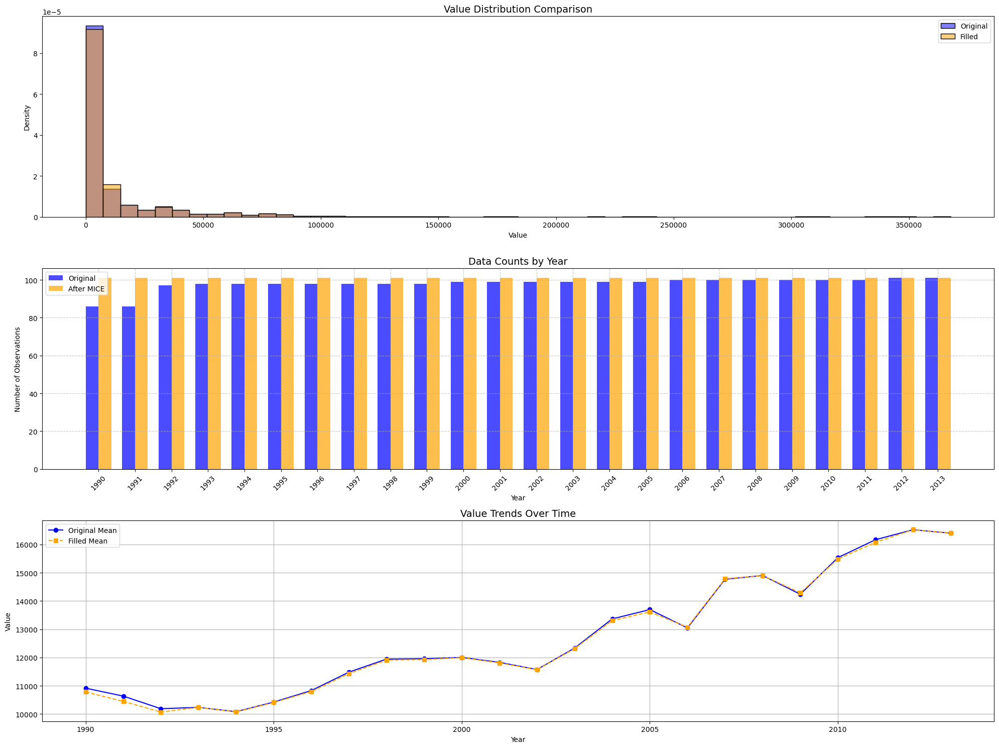

<Figure size 640x480 with 0 Axes>

In [64]:
def analyze_and_impute_pesticides(original_df, value_column='Value'):
    """
    Complete analysis pipeline for pesticides data:
    1. MICE imputation
    2. Comprehensive comparison
    3. Visualization
    
    Parameters:
    - original_df: Original dataframe.
    - value_column: Name of the value column to analyze (default='Value').
    """
    print("Starting MICE imputation process...")
    filled_df = iterative_mice_imputation(original_df, value_column=value_column)

    print("\nStarting dataset comparison...")
    compare_datasets(original_df, filled_df, value_column=value_column)

    return filled_df


def iterative_mice_imputation(df, value_column='Value'):
    """
    Perform MICE imputation on the given DataFrame.
    
    Parameters:
    - df: Input dataframe.
    - value_column: Column to impute (default='Value').
    """
    print("\nStarting MICE imputation...")
    pivot_df = df.pivot_table(index='Area', columns='year', values=value_column, aggfunc='first')

    imputer = IterativeImputer(max_iter=10, random_state=42, min_value=0)
    imputed_values = imputer.fit_transform(pivot_df)

    imputed_df = pd.DataFrame(
        imputed_values, index=pivot_df.index, columns=pivot_df.columns
    ).reset_index()

    imputed_df = imputed_df.melt(id_vars='Area', var_name='year', value_name=value_column)
    imputed_df['year'] = imputed_df['year'].astype(int)
    imputed_df[value_column] = imputed_df[value_column].round()

    print("MICE imputation completed.")
    return imputed_df


def compare_datasets(original_df, filled_df, value_column='Value'):
    """
    Compare original and filled datasets with detailed visualizations and statistics.
    
    Parameters:
    - original_df: Original dataframe.
    - filled_df: Filled dataframe.
    - value_column: Column to compare (default='Value').
    """
    if value_column not in original_df.columns or value_column not in filled_df.columns:
        raise ValueError(f"Column '{value_column}' not found in one of the datasets.")

    print("\n=== Dataset Size Comparison ===")
    print(f"Original dataset size: {original_df.shape}")
    print(f"Filled dataset size: {filled_df.shape}")

    print("\n=== Basic Statistics Comparison ===")
    print("\nOriginal dataset:")
    print(original_df[value_column].describe())
    print("\nFilled dataset:")
    print(filled_df[value_column].describe())

    plt.figure(figsize=(20, 15))

    # Distribution Plot
    plt.subplot(3, 1, 1)
    sns.histplot(data=original_df, x=value_column, bins=50, color='blue', alpha=0.5, label='Original', stat='density')
    sns.histplot(data=filled_df, x=value_column, bins=50, color='orange', alpha=0.5, label='Filled', stat='density')
    plt.title('Value Distribution Comparison', fontsize=14)
    plt.xlabel(value_column)
    plt.ylabel('Density')
    plt.legend()

    # Yearly Counts Plot
    plt.subplot(3, 1, 2)
    create_yearly_counts_plot(original_df, filled_df)

    # Time Trends Plot
    plt.subplot(3, 1, 3)
    create_time_trends_plot(original_df, filled_df, value_column=value_column)

    plt.tight_layout()
    plt.show()


def create_yearly_counts_plot(original_df, filled_df):
    """
    Plot yearly data counts comparison.
    """
    original_counts = original_df.groupby('year').size()
    filled_counts = filled_df.groupby('year').size()

    x = np.arange(len(original_counts.index))
    width = 0.35

    plt.bar(x - width / 2, original_counts.values, width, label='Original', color='blue', alpha=0.7)
    plt.bar(x + width / 2, filled_counts.values, width, label='After MICE', color='orange', alpha=0.7)

    plt.title('Data Counts by Year', fontsize=14)
    plt.xlabel('Year')
    plt.ylabel('Number of Observations')
    plt.xticks(x, original_counts.index, rotation=45)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)


def create_time_trends_plot(original_df, filled_df, value_column='Value'):
    """
    Plot time trends comparison.
    """
    orig_means = original_df.groupby('year')[value_column].mean().reset_index()
    filled_means = filled_df.groupby('year')[value_column].mean().reset_index()

    plt.plot(orig_means['year'], orig_means[value_column], marker='o', color='blue', label='Original Mean')
    plt.plot(filled_means['year'], filled_means[value_column], marker='s', linestyle='--', color='orange', label='Filled Mean')
    plt.title(f'{value_column} Trends Over Time', fontsize=14)
    plt.xlabel('Year')
    plt.ylabel(value_column)
    plt.legend()
    plt.grid(True)
    plt.gca().yaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
    plt.tight_layout()
    plt.show()

df_pesticides_filled = analyze_and_impute_pesticides(df_pesticides_cleaned, value_column='Value')

# Save the updated DataFrame
df_pesticides_filled.to_csv('pesticides_MICE_cleaned.csv', index=False)


In [62]:
df_yield_filled.rename(columns={"Value": "yield"}, inplace=True)
df_pesticides_filled.rename(columns={"Value": "tonnes_of_active_ingredients"}, inplace=True)

# Merge the datasets into one combined dataset using an outer join on 'Area' and 'year'
pesticides_yield_dataset = pd.merge(df_pesticides_filled, df_yield_filled, on=['Area', 'year'], how='outer')
agricultural_dataset = pd.merge(pesticides_yield_dataset, df_rainfall_average_tempmerged_data, on=['Area', 'year'], how='outer')

# Save the combined dataset for review
agricultural_dataset.to_csv('agricultural_dataset.csv', index=False)

# Display the structure of the combined dataset
agricultural_dataset.info()

# Provide a summary of the merged data
agricultural_dataset.describe(include='all')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14352 entries, 0 to 14351
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           14352 non-null  object 
 1   year                           14352 non-null  int32  
 2   tonnes_of_active_ingredients   14352 non-null  float64
 3   Item                           14352 non-null  object 
 4   yield                          14352 non-null  int32  
 5   average_rain_fall_mm_per_year  14352 non-null  float64
 6   avg_temp                       14352 non-null  float64
dtypes: float64(3), int32(2), object(2)
memory usage: 672.9+ KB


,Area,year,tonnes_of_active_ingredients,Item,yield,average_rain_fall_mm_per_year,avg_temp
count,14352,14352.000000,14352.000000,14352,14352.000000,14352.000000,14352.000000
unique,101,NaN,NaN,10,NaN,NaN,NaN
top,Kenya,NaN,NaN,Potatoes,NaN,NaN,NaN
freq,240,NaN,NaN,2280,NaN,NaN,NaN
mean,NaN,2001.500000,14561.943841,NaN,70192.426003,1159.056856,19.811999
std,NaN,6.922428,32877.610889,NaN,78488.520217,742.158763,6.741209
min,NaN,1990.000000,0.000000,NaN,50.000000,51.000000,1.300000
25%,NaN,1995.750000,268.000000,NaN,18005.250000,608.000000,15.513333
50%,NaN,2001.500000,2281.000000,NaN,38751.000000,1083.000000,20.630000
75%,NaN,2007.250000,13026.000000,NaN,96208.000000,1651.000000,25.895455
